In [ ]:
!nvidia-smi

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/projects/Segmentation/Dataset_2/all.tar.xz .
!cp /content/drive/MyDrive/projects/Segmentation/Dataset_2/tehran.tar.xz .
!tar -xvf all.tar.xz
!tar -xvf tehran.tar.xz
!pip install tensorflow_io

In [ ]:
!pip install tensorflow_io

In [ ]:

import tensorflow as tf
import numpy as np
import cv2
import os
import tqdm
import glob
import matplotlib.pyplot as plt
import tensorflow_io as tfio
from IPython.display import clear_output
%matplotlib inline

In [ ]:
IMG_SIZE = 256
BATCH_SIZE = 10
BUFFER_SIZE = 10*BATCH_SIZE


# Create and load dataset:

In [ ]:

def slicing_images(output_file,image_list, img_size,stride=64,format='tif'):
  f = open(output_file,'w')
  num_samples = 0
  pbar = tqdm.tqdm(image_list)
  skip_images = 0
  for n,name in enumerate(pbar):
    img = cv2.imread(name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    skip_sections = 0
    if not os.path.isfile(name.replace('tif','png')):
      skip_images += 1
      continue
    mask = cv2.imread(name.replace('tif','png'))
    h, w = img.shape

    for i in range(0,h,stride):
      for j in range(0,w,stride):
        x0 = j
        x1 = j + img_size
        if x1>=w:
          x1 = w - 1
        y0 = i
        y1 = i + img_size
        if y1>=h:
          y1 = h - 1
        if (y1-y0)<img_size or (x1-x0)<img_size:
          skip_sections += 1
          continue
        sub_mask = mask[y0:y1,x0:x1]
        sub_img = img[y0:y1,x0:x1]
        if sub_mask.sum()<img_size*16 or (sub_img==0).sum()>img_size*img_size/2 or (sub_img==255).sum()>img_size*img_size/2:
          skip_sections += 1
          continue
        # plt.subplot(2,2,1)
        # plt.imshow(sub_mask)
        # plt.subplot(2,2,2)
        # plt.imshow(sub_img)
        # plt.show()

        num_samples += 1
        f.write('%s %d %d %d %d\n'%(name,x0,y0, x1, y1))
    pbar.set_description("%d-%d  skiped=%d, unvalid sections=%d"%(n,len(image_list),skip_images,skip_sections ))
  f.close()
  print()
  print("done!!")
  return num_samples


In [ ]:
train_list = ['/content/drive/MyDrive/road/all/city0.tif',
              '/content/drive/MyDrive/road/all/city1.tif',
             '/content/drive/MyDrive/road/all/city2.tif',
             '/content/drive/MyDrive/road/all/city3.tif',
             '/content/drive/MyDrive/road/all/city4.tif',
             '/content/drive/MyDrive/road/all/city5.tif',
              '/content/drive/MyDrive/road/all/city7.tif',]

test_list = ['/content/drive/MyDrive/road/all/test.tif',]
val_list = ['/content/drive/MyDrive/road/all/city8.tif',]
if os.path.isfile('train.txt'):
  num_train_samples = len(open('train.txt','r').readlines())
else:
  num_train_samples = slicing_images('train.txt',train_list,IMG_SIZE,64,'tiff')
if os.path.isfile('val.txt'):
  num_val_samples = len(open('val.txt','r').readlines())
else:
  num_val_samples = slicing_images('val.txt',val_list,IMG_SIZE,IMG_SIZE,'tiff')
if os.path.isfile('test.txt'):
  num_test_samples = len(open('test.txt','r').readlines())
else:
  num_test_samples = slicing_images('test.txt',test_list,IMG_SIZE,IMG_SIZE,'tiff')
print("train samples: ", num_train_samples)
print("val samples: ", num_val_samples)
print("test sampels: ", num_test_samples)

  0%|          | 0/1 [00:00<?, ?it/s]


done!!


  0%|          | 0/1 [00:00<?, ?it/s]


done!!


0-1  skiped=0, unvalid sections=63: 100%|██████████| 1/1 [00:03<00:00,  3.22s/it]


done!!
train samples:  2864
val samples:  32
test sampels:  105


In [ ]:
def read_data(line,split):
  info = tf.strings.split(line,' ')
  img_path = info[0]
  x0 = tf.strings.to_number(info[1],tf.int32)
  x1 = tf.strings.to_number(info[3], tf.int32)
  y0 = tf.strings.to_number(info[2], tf.int32)
  y1 = tf.strings.to_number(info[4], tf.int32)
  mask_path = tf.strings.regex_replace(img_path,split,"%s_labels"%split)
  mask_path = tf.strings.regex_replace(mask_path,'tif',"png")
  raw_img = tf.io.read_file(img_path)
  img = tfio.experimental.image.decode_tiff(raw_img)


  # img = img[...,:3]
  raw_mask = tf.io.read_file(mask_path)
  mask = tf.image.decode_png(raw_mask)
  # mask = mask[...,1:]
  img = tf.image.crop_to_bounding_box(img,y0,x0,y1-y0,x1-x0)
  img = tf.image.resize_with_crop_or_pad(img,IMG_SIZE,IMG_SIZE)
  img.set_shape([IMG_SIZE,IMG_SIZE,4])
  img = tfio.experimental.color.rgba_to_rgb(img)
  mask = tf.image.crop_to_bounding_box(mask,y0,x0,y1-y0,x1-x0)
  mask = tf.image.resize_with_crop_or_pad(mask,IMG_SIZE,IMG_SIZE)
  img = (tf.cast(img,tf.float32) - 128.)/128.
  mask = tf.cast(mask, tf.int64)
  return img, mask
@tf.function
def augment(img, mask):
  if tf.random.uniform((),0,1,tf.float32)<0.5:
    img = tf.image.flip_left_right(img)
    mask = tf.image.flip_left_right(mask)
  if tf.random.uniform((),0,1,tf.float32)<0.5:
    img = tf.image.flip_up_down(img)
    mask = tf.image.flip_up_down(mask)
  if tf.random.uniform((),0,1,tf.float32)<0.5:
    img = tf.image.rot90(img)
    mask = tf.image.rot90(mask)

  return img, mask



In [ ]:
ds_train = tf.data.TextLineDataset('train.txt').shuffle(num_train_samples)
ds_val = tf.data.TextLineDataset('val.txt')
ds_test = tf.data.TextLineDataset('test.txt')
ds_train = ds_train.map(lambda x:read_data(x,'train'),num_parallel_calls=tf.data.experimental.AUTOTUNE)
ds_train = ds_train.map(augment).shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
ds_train = ds_train.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
ds_val = ds_val.map(lambda x:read_data(x,'val')).batch(BATCH_SIZE).repeat()
ds_test = ds_test.map(lambda x:read_data(x,'test')).batch(BATCH_SIZE).repeat()

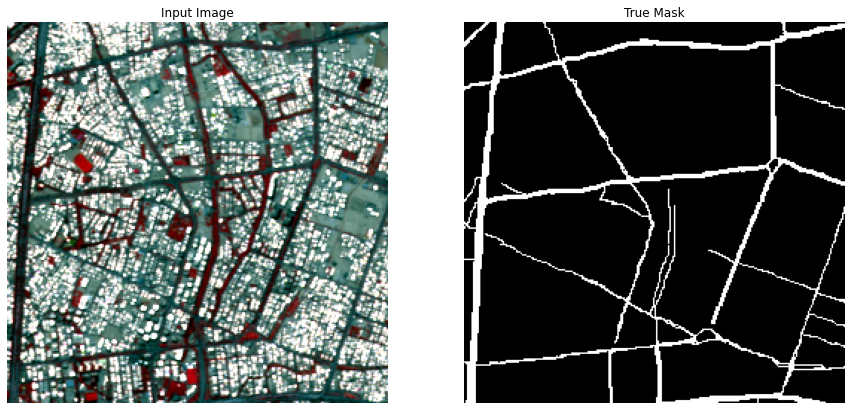

In [ ]:
def display(display_list,size=(15, 15)):
  plt.figure(figsize=size)

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    img = display_list[i].numpy()
    img = (img - img.min())/(img.max() - img.min()+1e-5)
    cmap = 'brg'
    if img.shape[-1]==1:
      img = np.squeeze(img, -1)
      cmap = 'gray'
    plt.imshow(img,cmap)

    plt.axis('off')
  plt.show()

img, mask = next(iter(ds_train))
display([img[0], mask[0]])

# Define Model:

In [ ]:
from tensorflow import keras
L = keras.layers
class RCU(keras.Model):
  def __init__(self,out_channels):
    super(RCU, self).__init__()
    self.conv1x1 = L.Convolution2D(out_channels,1,1,'same')
    self.conv3x3_1 = L.Convolution2D(out_channels,3,1,'same')
    self.conv3x3_2 = L.Convolution2D(out_channels,3,1,'same')
    self.relu_1 = L.ReLU()
    self.relu_2 = L.ReLU()
    self.bn = L.BatchNormalization()
  def call(self, x, training=False):
    x = self.conv1x1(x)
    res = x
    x = self.relu_1(self.conv3x3_1(x))
    x = self.conv3x3_2(x)
    x = x + res
    x = self.bn(x,training)
    x = self.relu_2(x)
    return x

def DPU(out_channels,dilate):
  return keras.Sequential([L.Convolution2D(out_channels,3,1,'same',dilation_rate=dilate),
                           L.Convolution2D(out_channels,3,1,'same')])

In [ ]:
class RDRCNN(keras.Model):
  def __init__(self,out_channels):
    super(RDRCNN,self).__init__()
    self.dblock1 = keras.Sequential([RCU(64),
                                    RCU(64),
    ])
    self.down_sample1 = L.MaxPool2D(2,2,'same')

    self.dblock2 = keras.Sequential([RCU(128),
                                    RCU(128),
    ])
    self.down_sample2 = L.MaxPool2D(2,2,'same')

    self.dblock3 = keras.Sequential([RCU(256),
                                    RCU(256),
    ])
    self.down_sample3 = L.MaxPool2D(2,2,'same')

    self.dpus = keras.Sequential([
                                  DPU(512,6),
                                  DPU(512,12),
                                  DPU(512,15),
                                  DPU(512,24),
    ])
    self.ublock1 = keras.Sequential([L.Convolution2D(64,3,1,'same'),
                                      L.ReLU(),
                                      L.Convolution2D(64,3,1,'same'),
                                      L.ReLU()])


    self.ublock2 = keras.Sequential([L.Convolution2D(128,3,1,'same'),
                                      L.ReLU(),
                                      L.Convolution2D(128,3,1,'same'),
                                      L.ReLU()])
    self.ublock3 = keras.Sequential([L.Convolution2D(256,3,1,'same'),
                                      L.ReLU(),
                                      L.Convolution2D(256,3,1,'same'),
                                      L.ReLU()])
    self.conv_out = L.Convolution2D(out_channels,3,1,'same')
  def nearest_upsampling(self,data, scale):
    """Nearest neighbor upsampling implementation."""
    bs, h, w, c = data.get_shape().as_list()
    bs = -1 if bs is None else bs
    # Use reshape to quickly upsample the input.  The nearest pixel is selected
    # implicitly via broadcasting.
    data = tf.reshape(data, [bs, h, 1, w, 1, c]) * tf.ones(
        [1, 1, scale, 1, scale, 1], dtype=data.dtype)
    return tf.reshape(data, [bs, h * scale, w * scale, c])

  def call(self,x, training=False):
    s0 = self.dblock1(x, training) #1
    s1 = self.down_sample1(s0)     #1/2
    s1 = self.dblock2(s1, training)#1/2
    s2 = self.down_sample2(s1)     #1/4
    s2 = self.dblock3(s2, training)#1/4
    s3 = self.down_sample3(s2)     #1/8
    s3 = self.dpus(s3)            #1/8
    x2 = self.nearest_upsampling(s3,2)#1/4
    x2 = tf.concat([x2,s2],-1)        #1/4
    x2 = self.ublock3(x2)
    x1 = self.nearest_upsampling(x2,2)
    x1 = tf.concat([x1,s1],-1)
    x1 = self.ublock2(x1)
    x0 = self.nearest_upsampling(x1,2)
    x0 = tf.concat([x0,s0],-1)
    x0 = self.ublock1(x0)
    out = self.conv_out(x0)
    return out





In [ ]:
model = RDRCNN(1)
_ = model(img)

### Auxilary functions:

In [ ]:
@tf.function
def f1score_fn(targets, outputs,score_threshold):
  outputs = tf.where(outputs>=score_threshold,tf.ones_like(outputs),tf.zeros_like(outputs))
  targets = tf.cast(targets, tf.float32)
  shape = tf.shape(targets)
  N = shape[0] * shape[1] * shape[2]
  tp_r = tf.math.count_nonzero(tf.cast(tf.equal(outputs, targets),tf.float32)*targets)
  fp_r = tf.math.count_nonzero(tf.cast(tf.not_equal(outputs, targets),tf.float32)*targets)
  fn_n = tf.math.count_nonzero(tf.cast(tf.not_equal(outputs, targets),tf.float32)*(1-targets))
  tn_n = tf.math.count_nonzero(tf.cast(tf.equal(outputs, targets),tf.float32)*(1-targets))
  tp_r = tf.cast(tp_r, tf.float32)
  fp_r = tf.cast(fp_r, tf.float32)
  fn_n = tf.cast(fn_n, tf.float32)
  tn_n = tf.cast(tn_n, tf.float32)
  p = tp_r/(tp_r+fp_r+1e-5)
  r = (tp_r)/(tp_r+fn_n+1e-5)
  f1 = 2 * (p*r)/(p+r+1e-5)
  return f1
def precision_fn(targets, outputs, score_threshold):
  outputs = tf.where(outputs>=score_threshold,tf.ones_like(outputs),tf.zeros_like(outputs))
  targets = tf.cast(targets, tf.float32)
  shape = tf.shape(targets)
  N = shape[0] * shape[1] * shape[2]
  tp_r = tf.math.count_nonzero(tf.cast(tf.equal(outputs, targets),tf.float32)*targets)
  fp_r = tf.math.count_nonzero(tf.cast(tf.not_equal(outputs, targets),tf.float32)*targets)
  fn_n = tf.math.count_nonzero(tf.cast(tf.not_equal(outputs, targets),tf.float32)*(1-targets))
  tn_n = tf.math.count_nonzero(tf.cast(tf.equal(outputs, targets),tf.float32)*(1-targets))
  tp_r = tf.cast(tp_r, tf.float32)
  fp_r = tf.cast(fp_r, tf.float32)
  fn_n = tf.cast(fn_n, tf.float32)
  tn_n = tf.cast(tn_n, tf.float32)
  p = tp_r/(tp_r+fp_r+1e-5)
  r = (tp_r)/(tp_r+fn_n+1e-5)
  return p
def recall_fn(targets, outputs, score_threshold):
  outputs = tf.where(outputs>=score_threshold,tf.ones_like(outputs),tf.zeros_like(outputs))
  targets = tf.cast(targets, tf.float32)
  shape = tf.shape(targets)
  N = shape[0] * shape[1] * shape[2]
  tp_r = tf.math.count_nonzero(tf.cast(tf.equal(outputs, targets),tf.float32)*targets)
  fp_r = tf.math.count_nonzero(tf.cast(tf.not_equal(outputs, targets),tf.float32)*targets)
  fn_n = tf.math.count_nonzero(tf.cast(tf.not_equal(outputs, targets),tf.float32)*(1-targets))
  tn_n = tf.math.count_nonzero(tf.cast(tf.equal(outputs, targets),tf.float32)*(1-targets))
  tp_r = tf.cast(tp_r, tf.float32)
  fp_r = tf.cast(fp_r, tf.float32)
  fn_n = tf.cast(fn_n, tf.float32)
  tn_n = tf.cast(tn_n, tf.float32)
  p = tp_r/(tp_r+fp_r+1e-5)
  r = (tp_r)/(tp_r+fn_n+1e-5)
  return r

@tf.function
def OA_fn(targets, outputs, score_threshold):

  outputs = tf.where(outputs>=score_threshold,tf.ones_like(outputs),tf.zeros_like(outputs))
  targets = tf.cast(targets, tf.float32)
  shape = tf.shape(targets)
  N = shape[0] * shape[1] * shape[2]
  tp_r = tf.math.count_nonzero(tf.cast(tf.equal(outputs, targets),tf.float32)*targets)
  tn_n = tf.math.count_nonzero(tf.cast(tf.equal(outputs, targets),tf.float32)*(1-targets))
  tp_r = tf.cast(tp_r, tf.float32)
  tn_n = tf.cast(tn_n, tf.float32)
  oa = (tp_r+tn_n)/tf.cast(N,tf.float32)
  return oa

In [ ]:
def create_mask(pred_mask,score_threshold=.3):
  pred_mask = tf.where(pred_mask>=score_threshold,tf.ones_like(pred_mask),tf.zeros_like(pred_mask))
  return pred_mask

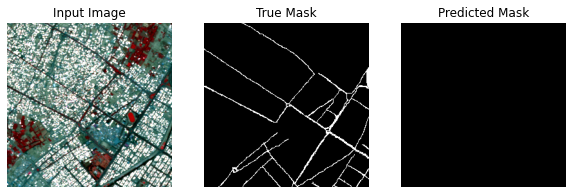

In [ ]:
imgs, masks = next(iter(ds_train))
pred_mask = model.predict(imgs)
pred_mask = create_mask(pred_mask,0.3)
display([imgs[0], masks[0],pred_mask[0]],size=(10,10))

In [ ]:
def show_predictions(dataset, num=2, score_threshold=.3):
  images, masks = next(iter(dataset))
  pred_masks = model.predict(images)
  pred_masks = tf.nn.sigmoid(pred_masks)
  for i in range(num):
    display([images[i], masks[i], create_mask(pred_masks,score_threshold)[i]],size=(10,10))

# class display_callback(tf.keras.callbacks.Callback):
#   def on_epoch_end(self, epoch, logs=None):
#     show_predictions(ds_test,2)
#     print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

# early_call = tf.keras.callbacks.EarlyStopping(
#     monitor='val_OAscore', min_delta=0.001, patience=5, verbose=1, mode='auto',
#     baseline=None, restore_best_weights=True
# )

# checkpoint_filepath = '/content/drive/MyDrive/projects/Segmentation/model_v3_saved/ckpt'
# model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
#     filepath=checkpoint_filepath,
#     save_weights_only=False,
#     monitor='val_OAscore',
#     mode='max',
#     save_best_only=True)


# Training:

In [ ]:
train_steps = num_train_samples//BATCH_SIZE + 1
test_steps = num_test_samples//BATCH_SIZE + 1
val_steps = num_val_samples//BATCH_SIZE + 1
EPOCHS = 68
lr_sc = tf.keras.optimizers.schedules.ExponentialDecay(1e-5,num_train_samples//BATCH_SIZE ,decay_rate=0.96)
optimizer = tf.keras.optimizers.Adam(lr_sc,beta_1=0.9,beta_2=0.999)
checkpoint_dir = '/content/drive/MyDrive/road/rdrcnn'
ckpt = tf.train.Checkpoint(optimizer=optimizer, segment_model=model)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_dir,max_to_keep=2)
if ckpt_manager.latest_checkpoint:
  status = ckpt.restore(ckpt_manager.latest_checkpoint)
  #status.assert_consumed()
  print("Restored from {}".format(ckpt_manager.latest_checkpoint))
else:
  print("Initializing from scratch.")
# model.load_weights(checkpoint_filepath)
# model_history = model.fit(ds_train,steps_per_epoch=train_steps, validation_data=ds_val,validation_steps=val_steps, epochs=EPOCHS, callbacks=[display_callback(),early_call,model_checkpoint_callback])
# model.save(checkpoint_filepath+'final')

Restored from /content/drive/MyDrive/road/rdrcnn/ckpt-32


In [ ]:
loss_fn = keras.losses.BinaryCrossentropy(from_logits=True)
metrics = {"OA":keras.metrics.Mean(),
           "recall":keras.metrics.Mean(),
           "precision":keras.metrics.Mean(),
           "f1_score":keras.metrics.Mean(),
           "loss":keras.metrics.Mean()}
test_metrics = {"OA":keras.metrics.Mean(),
           "recall":keras.metrics.Mean(),
           "precision":keras.metrics.Mean(),
           "f1_score":keras.metrics.Mean(),
           "loss":keras.metrics.Mean()}
train_history = {"OA":[],
                "recall":[],
                "precision":[],
                "f1_score":[],
                "loss":[]}
test_history = {"OA":[],
                "recall":[],
                "precision":[],
                "f1_score":[],
                "loss":[]}

def train_fn(images, labels, score_threshold=.5):
  with tf.GradientTape() as tape:
    outputs = model(images, training=True)
    loss = loss_fn(labels,outputs)
  grads = tape.gradient(loss,model.trainable_variables)
  optimizer.apply_gradients(zip(grads, model.trainable_variables))
  outputs = tf.nn.sigmoid(outputs)
  recall = recall_fn(labels, outputs,score_threshold)
  precision = precision_fn(labels, outputs,score_threshold)
  oa = OA_fn(labels, outputs,score_threshold)
  f1_score = f1score_fn(labels, outputs,score_threshold)
  metrics['recall'].update_state(recall)
  metrics['precision'].update_state(precision)
  metrics['OA'].update_state(oa)
  metrics['f1_score'].update_state(f1_score)
  metrics['loss'].update_state(loss)


  for d in metrics.keys():
    train_history[d].append(metrics[d].result().numpy())


def evaluate(images, labels,score_threshold=.5):
  outputs = model.predict(images)
  loss = loss_fn(labels,outputs)
  outputs = tf.nn.sigmoid(outputs)
  recall = recall_fn(labels, outputs,score_threshold)
  precision = precision_fn(labels, outputs,score_threshold)
  oa = OA_fn(labels, outputs,score_threshold)
  f1_score = f1score_fn(labels, outputs,score_threshold)
  test_metrics['recall'].update_state(recall)
  test_metrics['precision'].update_state(precision)
  test_metrics['OA'].update_state(oa)
  test_metrics['f1_score'].update_state(f1_score)
  test_metrics['loss'].update_state(loss)



def clear_states(data):
  for d in data.keys():
    data[d].reset_states()

loss=0.0716 ,recall=0.7363 ,precision=0.6454 ,OA=0.9692 ,f1_score=0.6871 : 100%|██████████| 287/287 [06:42<00:00,  1.40s/it]
100%|██████████| 4/4 [00:06<00:00,  1.54s/it]



EPOCH[0] validate:
loss=0.0747 ,recall=0.7201 ,precision=0.7025 ,OA=0.9675 ,f1_score=0.7096 



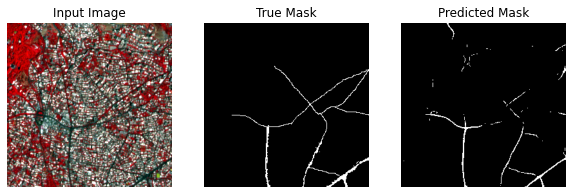

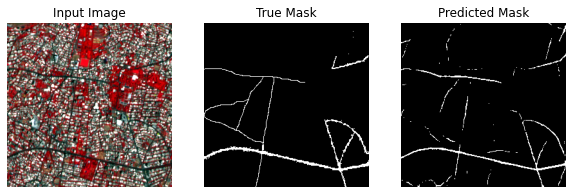

loss=0.0714 ,recall=0.7365 ,precision=0.6471 ,OA=0.9693 ,f1_score=0.6882 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.44s/it]



EPOCH[1] validate:
loss=0.0764 ,recall=0.7039 ,precision=0.7148 ,OA=0.9667 ,f1_score=0.7077 



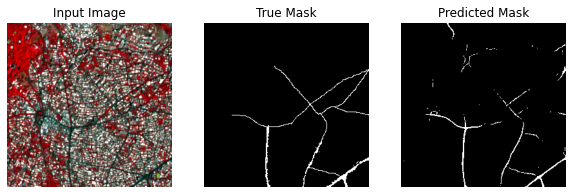

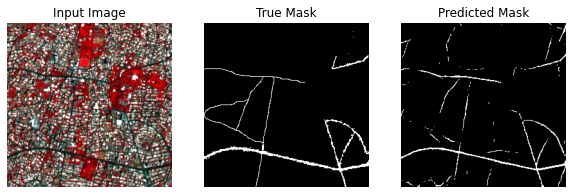

loss=0.0713 ,recall=0.7370 ,precision=0.6473 ,OA=0.9693 ,f1_score=0.6885 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.39s/it]



EPOCH[2] validate:
loss=0.0774 ,recall=0.6932 ,precision=0.7273 ,OA=0.9662 ,f1_score=0.7083 



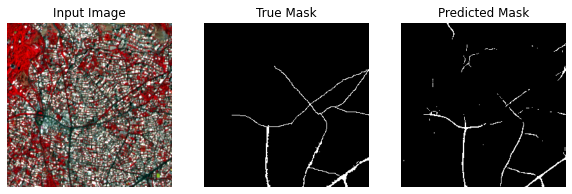

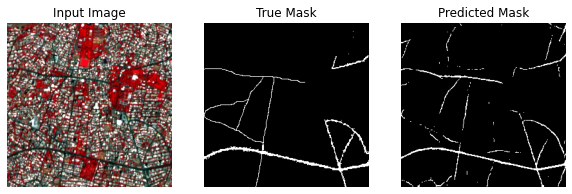

loss=0.0710 ,recall=0.7376 ,precision=0.6486 ,OA=0.9694 ,f1_score=0.6897 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.47s/it]



EPOCH[3] validate:
loss=0.0782 ,recall=0.6839 ,precision=0.7367 ,OA=0.9657 ,f1_score=0.7078 



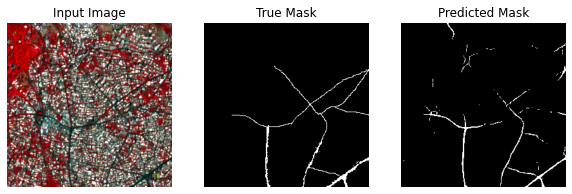

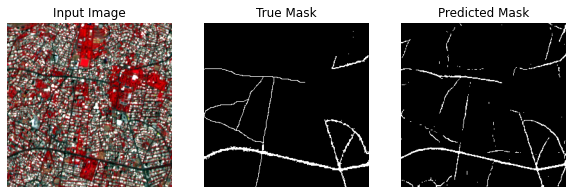

loss=0.0709 ,recall=0.7371 ,precision=0.6500 ,OA=0.9694 ,f1_score=0.6901 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.34s/it]



EPOCH[4] validate:
loss=0.0747 ,recall=0.7325 ,precision=0.6783 ,OA=0.9676 ,f1_score=0.7027 



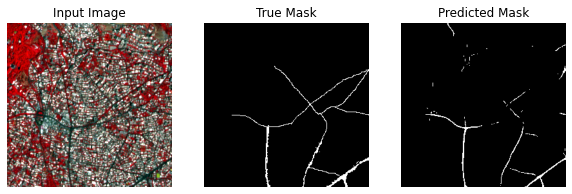

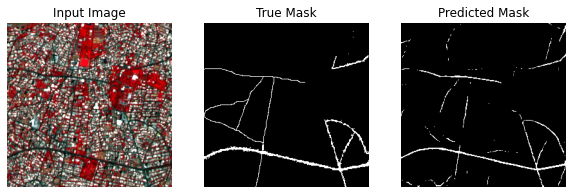

loss=0.0707 ,recall=0.7381 ,precision=0.6499 ,OA=0.9695 ,f1_score=0.6907 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.44s/it]



EPOCH[5] validate:
loss=0.0770 ,recall=0.7039 ,precision=0.7076 ,OA=0.9665 ,f1_score=0.7042 



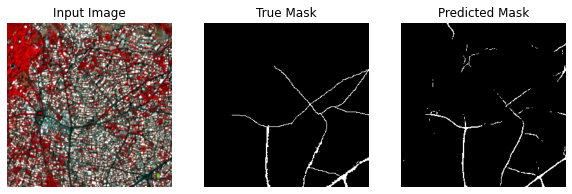

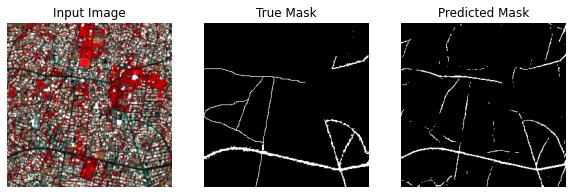

loss=0.0706 ,recall=0.7382 ,precision=0.6515 ,OA=0.9695 ,f1_score=0.6915 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.47s/it]



EPOCH[6] validate:
loss=0.0758 ,recall=0.7101 ,precision=0.7089 ,OA=0.9670 ,f1_score=0.7079 



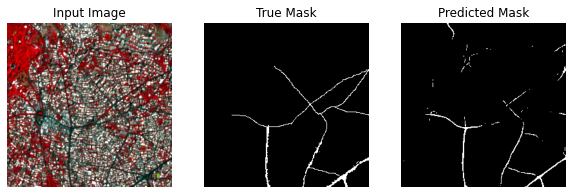

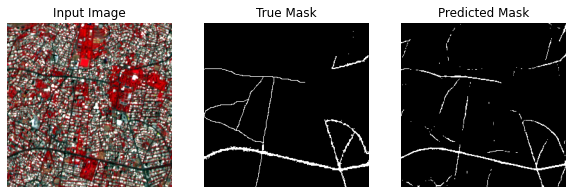

loss=0.0705 ,recall=0.7390 ,precision=0.6518 ,OA=0.9696 ,f1_score=0.6921 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.43s/it]



EPOCH[7] validate:
loss=0.0768 ,recall=0.6987 ,precision=0.7211 ,OA=0.9665 ,f1_score=0.7080 



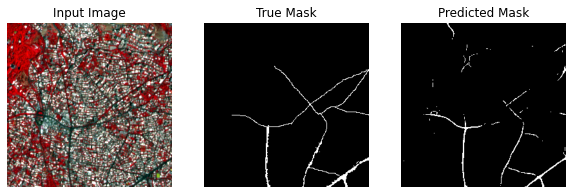

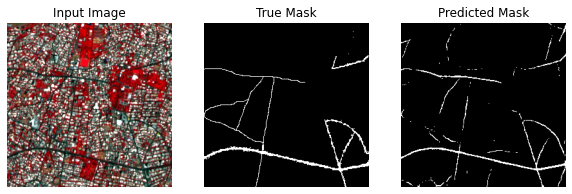

loss=0.0703 ,recall=0.7386 ,precision=0.6529 ,OA=0.9696 ,f1_score=0.6926 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.54s/it]



EPOCH[8] validate:
loss=0.0755 ,recall=0.7070 ,precision=0.7185 ,OA=0.9670 ,f1_score=0.7111 



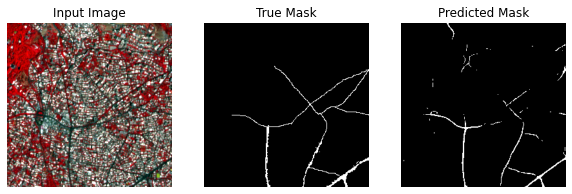

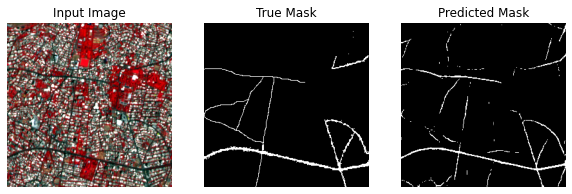

loss=0.0702 ,recall=0.7388 ,precision=0.6538 ,OA=0.9697 ,f1_score=0.6931 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.57s/it]



EPOCH[9] validate:
loss=0.0761 ,recall=0.7305 ,precision=0.6682 ,OA=0.9671 ,f1_score=0.6960 



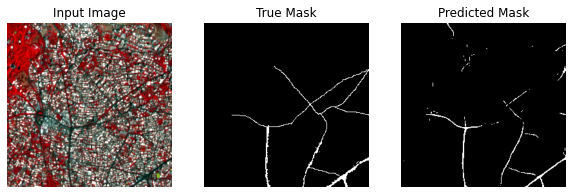

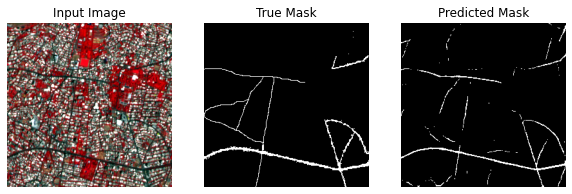

loss=0.0702 ,recall=0.7397 ,precision=0.6530 ,OA=0.9697 ,f1_score=0.6931 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.59s/it]



EPOCH[10] validate:
loss=0.0753 ,recall=0.7144 ,precision=0.7070 ,OA=0.9673 ,f1_score=0.7092 



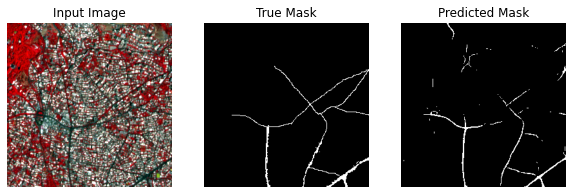

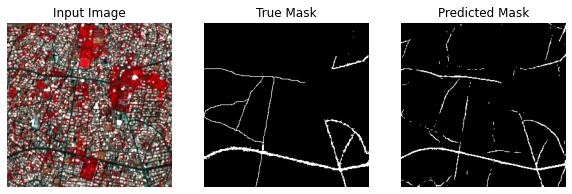

loss=0.0699 ,recall=0.7401 ,precision=0.6545 ,OA=0.9698 ,f1_score=0.6941 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.54s/it]



EPOCH[11] validate:
loss=0.0749 ,recall=0.7109 ,precision=0.7147 ,OA=0.9673 ,f1_score=0.7112 



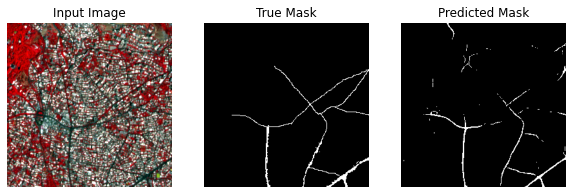

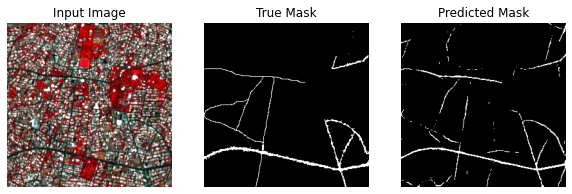

loss=0.0699 ,recall=0.7397 ,precision=0.6548 ,OA=0.9697 ,f1_score=0.6941 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.34s/it]



EPOCH[12] validate:
loss=0.0747 ,recall=0.7252 ,precision=0.6936 ,OA=0.9676 ,f1_score=0.7074 



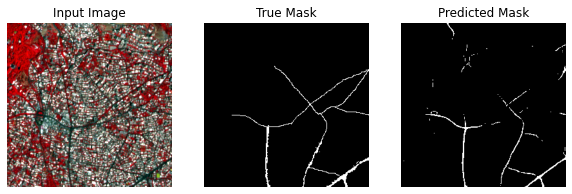

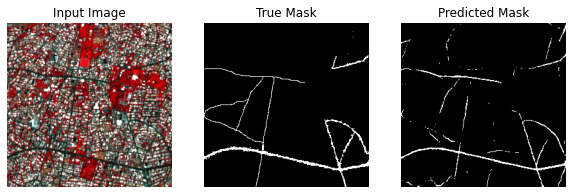

loss=0.0699 ,recall=0.7400 ,precision=0.6559 ,OA=0.9698 ,f1_score=0.6948 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.36s/it]



EPOCH[13] validate:
loss=0.0779 ,recall=0.6848 ,precision=0.7395 ,OA=0.9659 ,f1_score=0.7096 



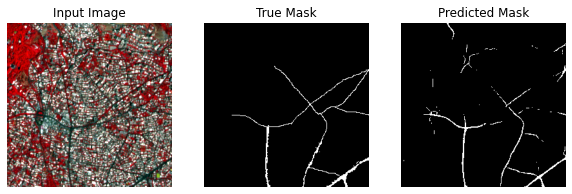

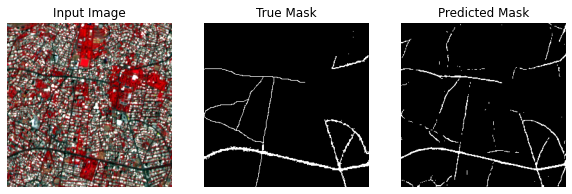

loss=0.0697 ,recall=0.7402 ,precision=0.6566 ,OA=0.9698 ,f1_score=0.6954 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.40s/it]



EPOCH[14] validate:
loss=0.0759 ,recall=0.7003 ,precision=0.7289 ,OA=0.9668 ,f1_score=0.7127 



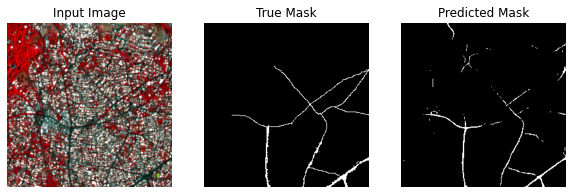

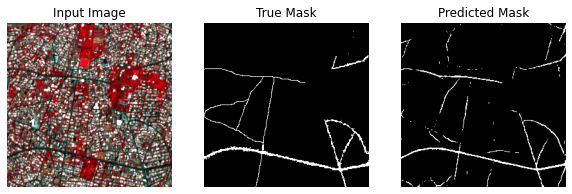

loss=0.0695 ,recall=0.7405 ,precision=0.6579 ,OA=0.9699 ,f1_score=0.6963 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.56s/it]



EPOCH[15] validate:
loss=0.0747 ,recall=0.7245 ,precision=0.6937 ,OA=0.9676 ,f1_score=0.7070 



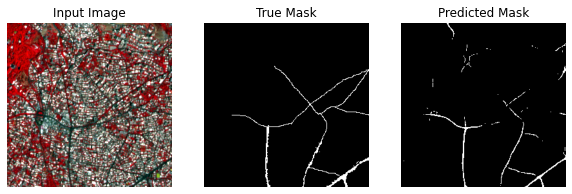

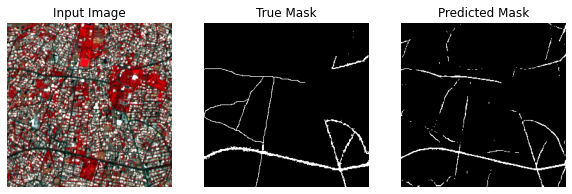

loss=0.0695 ,recall=0.7411 ,precision=0.6568 ,OA=0.9699 ,f1_score=0.6959 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.51s/it]



EPOCH[16] validate:
loss=0.0745 ,recall=0.7258 ,precision=0.6940 ,OA=0.9677 ,f1_score=0.7079 



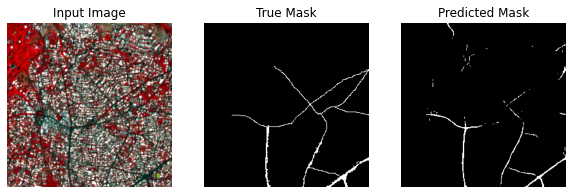

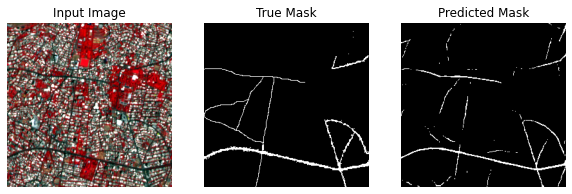

loss=0.0695 ,recall=0.7409 ,precision=0.6573 ,OA=0.9699 ,f1_score=0.6961 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.47s/it]



EPOCH[17] validate:
loss=0.0751 ,recall=0.7149 ,precision=0.7053 ,OA=0.9672 ,f1_score=0.7083 



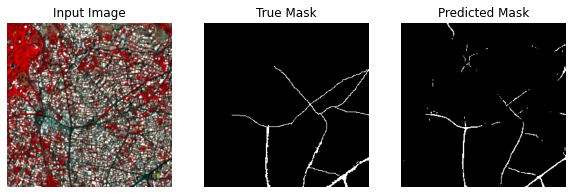

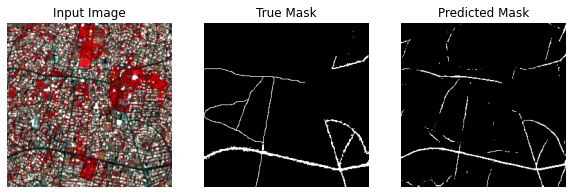

loss=0.0693 ,recall=0.7412 ,precision=0.6579 ,OA=0.9699 ,f1_score=0.6965 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.50s/it]



EPOCH[18] validate:
loss=0.0750 ,recall=0.7152 ,precision=0.7065 ,OA=0.9673 ,f1_score=0.7091 



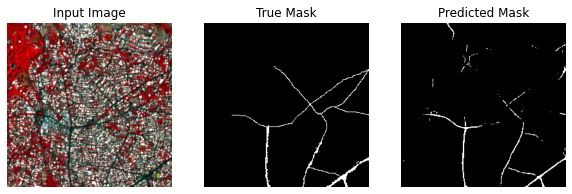

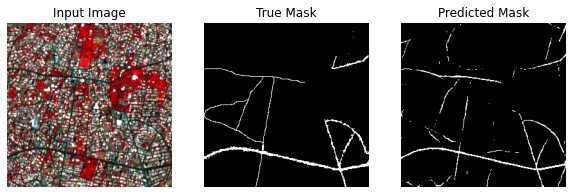

loss=0.0693 ,recall=0.7412 ,precision=0.6586 ,OA=0.9700 ,f1_score=0.6969 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.46s/it]



EPOCH[19] validate:
loss=0.0758 ,recall=0.7095 ,precision=0.7095 ,OA=0.9670 ,f1_score=0.7077 



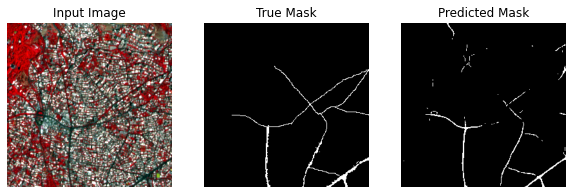

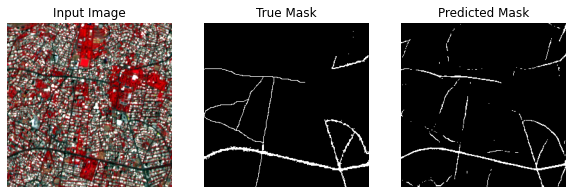

loss=0.0693 ,recall=0.7414 ,precision=0.6592 ,OA=0.9700 ,f1_score=0.6974 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.57s/it]



EPOCH[20] validate:
loss=0.0758 ,recall=0.7016 ,precision=0.7246 ,OA=0.9668 ,f1_score=0.7113 



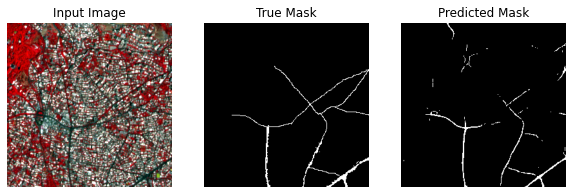

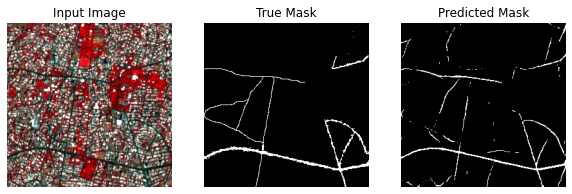

loss=0.0691 ,recall=0.7415 ,precision=0.6595 ,OA=0.9700 ,f1_score=0.6976 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.45s/it]



EPOCH[21] validate:
loss=0.0748 ,recall=0.7189 ,precision=0.7057 ,OA=0.9676 ,f1_score=0.7105 



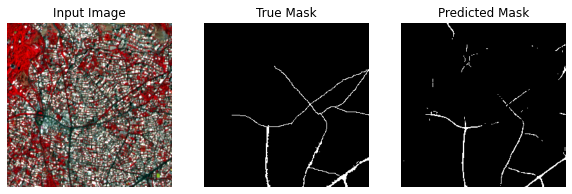

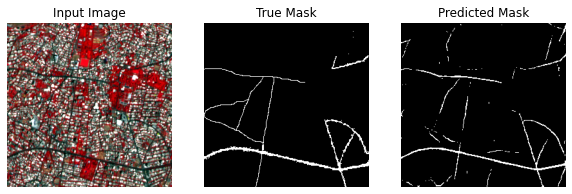

loss=0.0691 ,recall=0.7417 ,precision=0.6595 ,OA=0.9700 ,f1_score=0.6977 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.55s/it]



EPOCH[22] validate:
loss=0.0762 ,recall=0.6963 ,precision=0.7323 ,OA=0.9666 ,f1_score=0.7123 



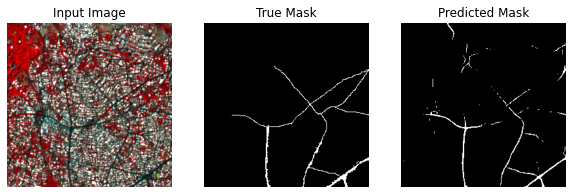

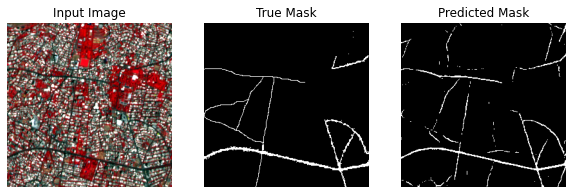

loss=0.0690 ,recall=0.7418 ,precision=0.6601 ,OA=0.9700 ,f1_score=0.6982 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.34s/it]



EPOCH[23] validate:
loss=0.0748 ,recall=0.7191 ,precision=0.7023 ,OA=0.9675 ,f1_score=0.7089 



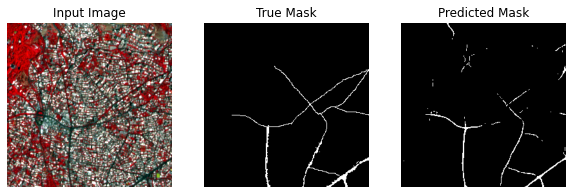

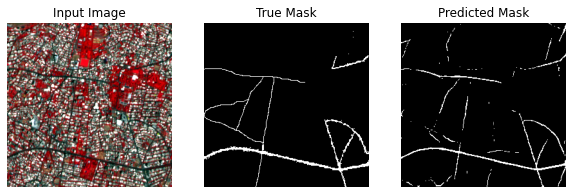

loss=0.0690 ,recall=0.7420 ,precision=0.6604 ,OA=0.9701 ,f1_score=0.6984 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.46s/it]



EPOCH[24] validate:
loss=0.0741 ,recall=0.7246 ,precision=0.7006 ,OA=0.9678 ,f1_score=0.7108 



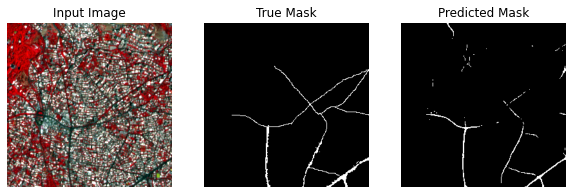

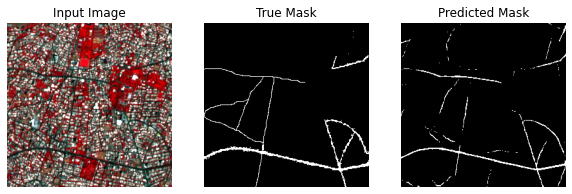

loss=0.0688 ,recall=0.7425 ,precision=0.6609 ,OA=0.9701 ,f1_score=0.6988 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.54s/it]



EPOCH[25] validate:
loss=0.0752 ,recall=0.7088 ,precision=0.7180 ,OA=0.9672 ,f1_score=0.7117 



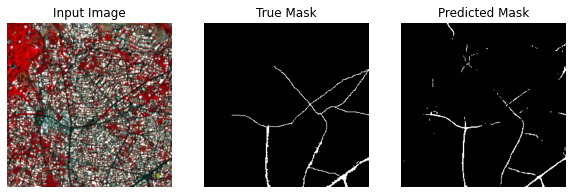

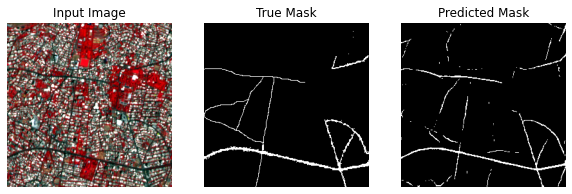

loss=0.0689 ,recall=0.7421 ,precision=0.6613 ,OA=0.9701 ,f1_score=0.6989 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.27s/it]



EPOCH[26] validate:
loss=0.0752 ,recall=0.7060 ,precision=0.7235 ,OA=0.9672 ,f1_score=0.7131 



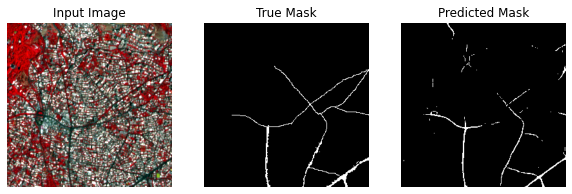

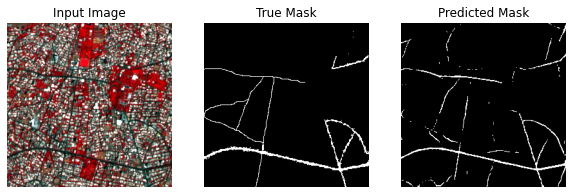

loss=0.0688 ,recall=0.7423 ,precision=0.6607 ,OA=0.9701 ,f1_score=0.6987 : 100%|██████████| 287/287 [06:32<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.39s/it]



EPOCH[27] validate:
loss=0.0752 ,recall=0.7158 ,precision=0.7053 ,OA=0.9673 ,f1_score=0.7089 



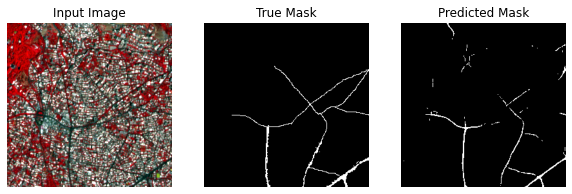

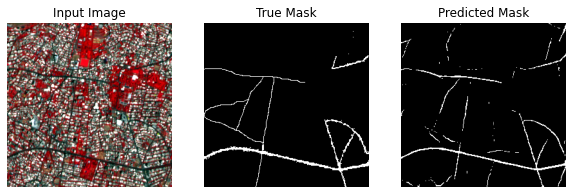

loss=0.0688 ,recall=0.7421 ,precision=0.6617 ,OA=0.9702 ,f1_score=0.6992 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.44s/it]



EPOCH[28] validate:
loss=0.0750 ,recall=0.7065 ,precision=0.7251 ,OA=0.9672 ,f1_score=0.7141 



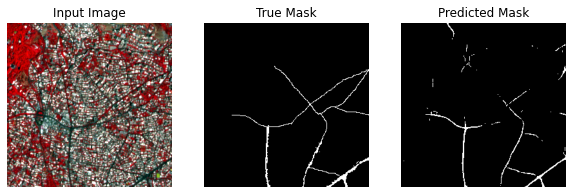

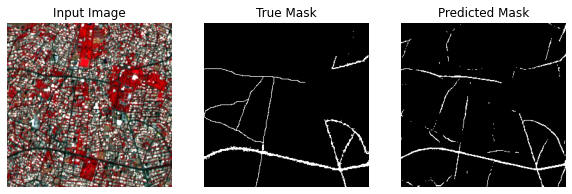

loss=0.0687 ,recall=0.7425 ,precision=0.6613 ,OA=0.9702 ,f1_score=0.6991 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.40s/it]



EPOCH[29] validate:
loss=0.0759 ,recall=0.7015 ,precision=0.7239 ,OA=0.9668 ,f1_score=0.7109 



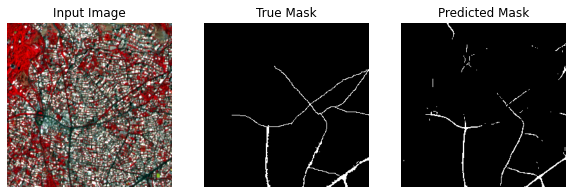

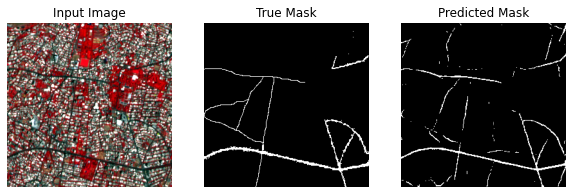

loss=0.0686 ,recall=0.7425 ,precision=0.6629 ,OA=0.9702 ,f1_score=0.7000 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.41s/it]



EPOCH[30] validate:
loss=0.0758 ,recall=0.7027 ,precision=0.7240 ,OA=0.9669 ,f1_score=0.7115 



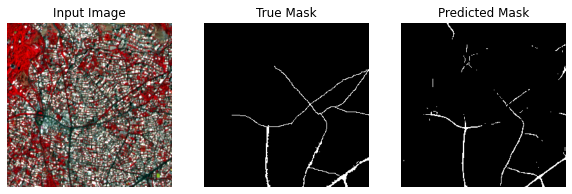

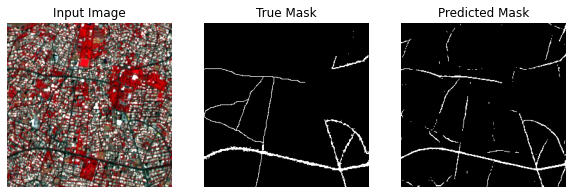

loss=0.0686 ,recall=0.7425 ,precision=0.6625 ,OA=0.9702 ,f1_score=0.6998 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.42s/it]



EPOCH[31] validate:
loss=0.0746 ,recall=0.7165 ,precision=0.7097 ,OA=0.9675 ,f1_score=0.7114 



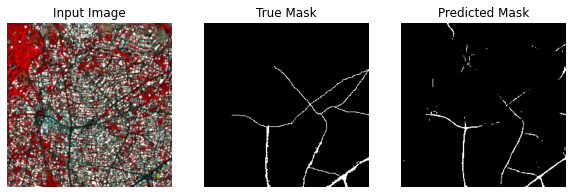

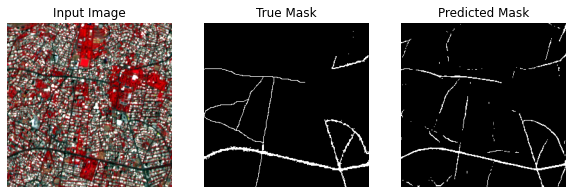

loss=0.0686 ,recall=0.7425 ,precision=0.6620 ,OA=0.9702 ,f1_score=0.6996 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.48s/it]



EPOCH[32] validate:
loss=0.0755 ,recall=0.7002 ,precision=0.7323 ,OA=0.9669 ,f1_score=0.7143 



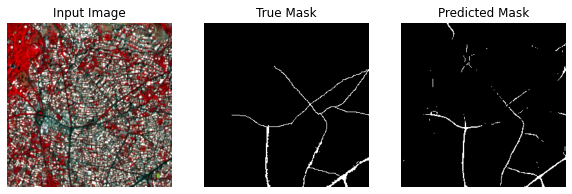

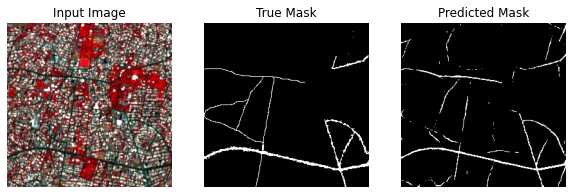

loss=0.0685 ,recall=0.7432 ,precision=0.6625 ,OA=0.9702 ,f1_score=0.7001 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.37s/it]



EPOCH[33] validate:
loss=0.0765 ,recall=0.6943 ,precision=0.7336 ,OA=0.9665 ,f1_score=0.7119 



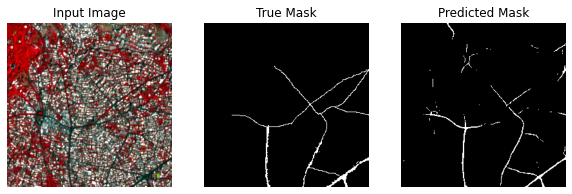

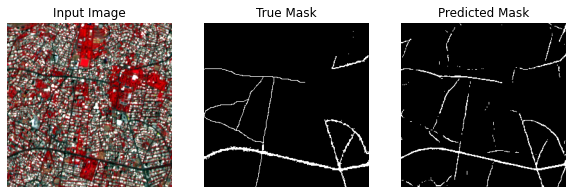

loss=0.0685 ,recall=0.7430 ,precision=0.6636 ,OA=0.9703 ,f1_score=0.7006 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:06<00:00,  1.54s/it]



EPOCH[34] validate:
loss=0.0747 ,recall=0.7184 ,precision=0.7069 ,OA=0.9676 ,f1_score=0.7109 



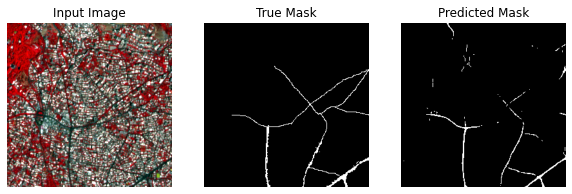

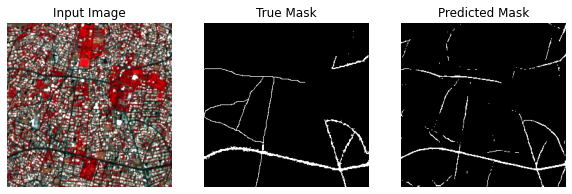

loss=0.0685 ,recall=0.7431 ,precision=0.6636 ,OA=0.9702 ,f1_score=0.7007 : 100%|██████████| 287/287 [06:32<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.43s/it]



EPOCH[35] validate:
loss=0.0752 ,recall=0.7093 ,precision=0.7167 ,OA=0.9672 ,f1_score=0.7113 



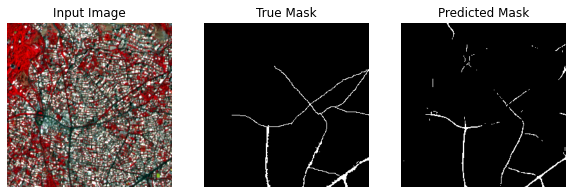

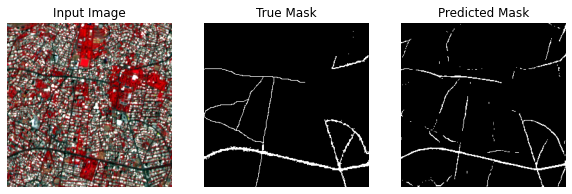

loss=0.0685 ,recall=0.7434 ,precision=0.6630 ,OA=0.9702 ,f1_score=0.7004 : 100%|██████████| 287/287 [06:32<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.42s/it]



EPOCH[36] validate:
loss=0.0750 ,recall=0.7136 ,precision=0.7107 ,OA=0.9673 ,f1_score=0.7105 



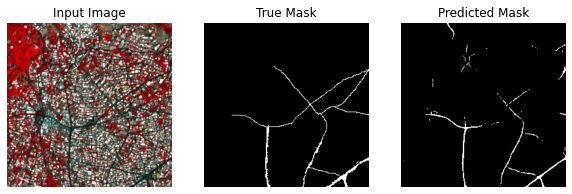

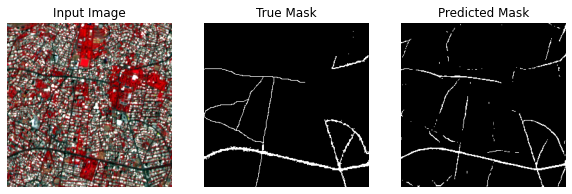

loss=0.0684 ,recall=0.7428 ,precision=0.6639 ,OA=0.9703 ,f1_score=0.7007 : 100%|██████████| 287/287 [06:32<00:00,  1.37s/it]
100%|██████████| 4/4 [00:06<00:00,  1.59s/it]



EPOCH[37] validate:
loss=0.0748 ,recall=0.7198 ,precision=0.7034 ,OA=0.9676 ,f1_score=0.7098 



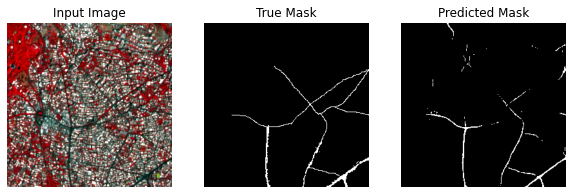

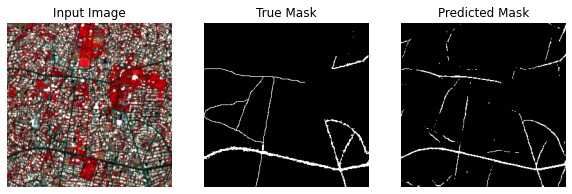

loss=0.0683 ,recall=0.7431 ,precision=0.6637 ,OA=0.9703 ,f1_score=0.7008 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:06<00:00,  1.54s/it]



EPOCH[38] validate:
loss=0.0753 ,recall=0.7070 ,precision=0.7197 ,OA=0.9671 ,f1_score=0.7116 



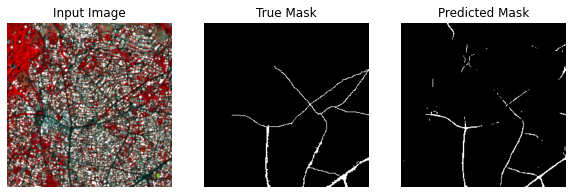

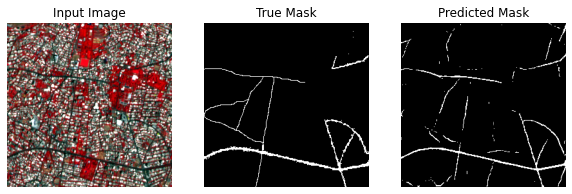

loss=0.0683 ,recall=0.7434 ,precision=0.6643 ,OA=0.9703 ,f1_score=0.7012 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:06<00:00,  1.55s/it]



EPOCH[39] validate:
loss=0.0755 ,recall=0.7063 ,precision=0.7178 ,OA=0.9670 ,f1_score=0.7103 



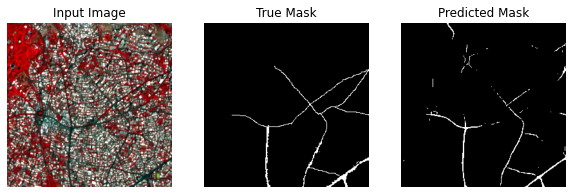

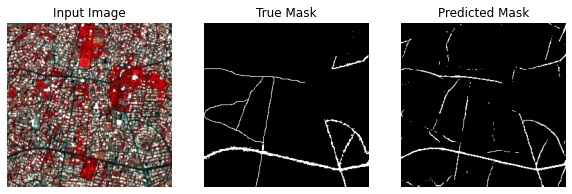

loss=0.0682 ,recall=0.7434 ,precision=0.6644 ,OA=0.9703 ,f1_score=0.7013 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.44s/it]



EPOCH[40] validate:
loss=0.0755 ,recall=0.7112 ,precision=0.7103 ,OA=0.9671 ,f1_score=0.7089 



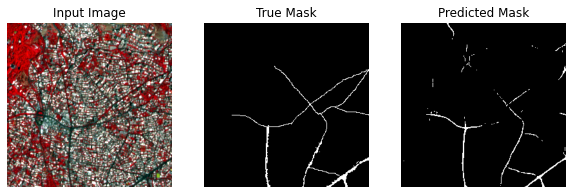

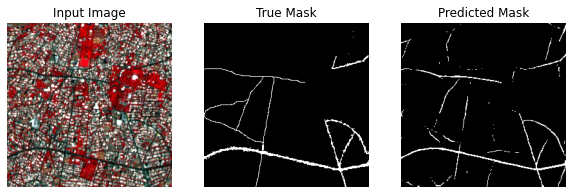

loss=0.0683 ,recall=0.7436 ,precision=0.6642 ,OA=0.9703 ,f1_score=0.7012 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.57s/it]



EPOCH[41] validate:
loss=0.0752 ,recall=0.7112 ,precision=0.7128 ,OA=0.9672 ,f1_score=0.7103 



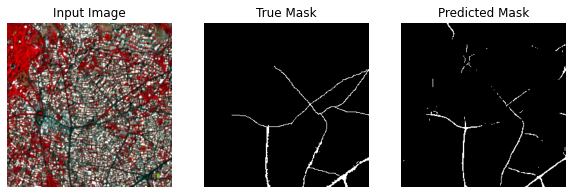

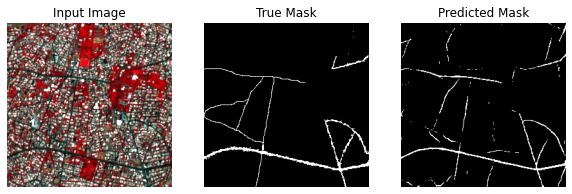

loss=0.0682 ,recall=0.7435 ,precision=0.6644 ,OA=0.9703 ,f1_score=0.7013 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.61s/it]



EPOCH[42] validate:
loss=0.0751 ,recall=0.7146 ,precision=0.7082 ,OA=0.9673 ,f1_score=0.7097 



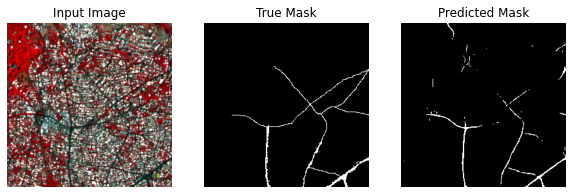

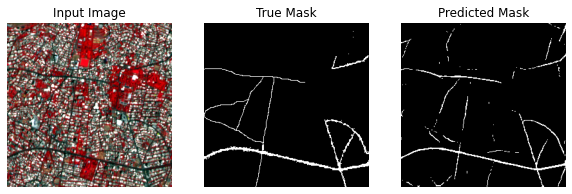

loss=0.0682 ,recall=0.7434 ,precision=0.6646 ,OA=0.9703 ,f1_score=0.7014 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.44s/it]



EPOCH[43] validate:
loss=0.0749 ,recall=0.7202 ,precision=0.7029 ,OA=0.9676 ,f1_score=0.7097 



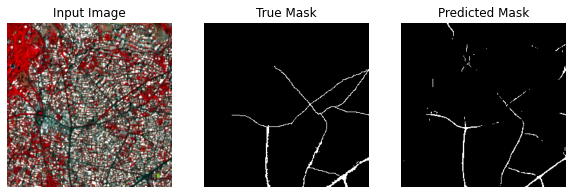

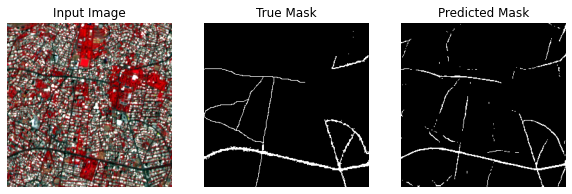

loss=0.0683 ,recall=0.7436 ,precision=0.6640 ,OA=0.9703 ,f1_score=0.7012 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:06<00:00,  1.50s/it]



EPOCH[44] validate:
loss=0.0754 ,recall=0.7093 ,precision=0.7151 ,OA=0.9671 ,f1_score=0.7105 



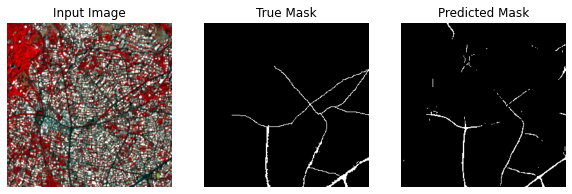

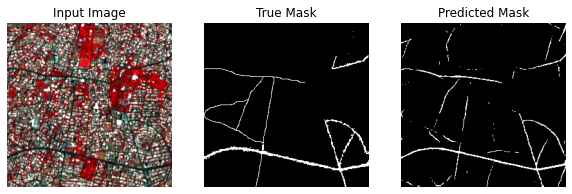

loss=0.0682 ,recall=0.7431 ,precision=0.6647 ,OA=0.9703 ,f1_score=0.7014 : 100%|██████████| 287/287 [06:32<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.44s/it]



EPOCH[45] validate:
loss=0.0749 ,recall=0.7167 ,precision=0.7073 ,OA=0.9675 ,f1_score=0.7104 



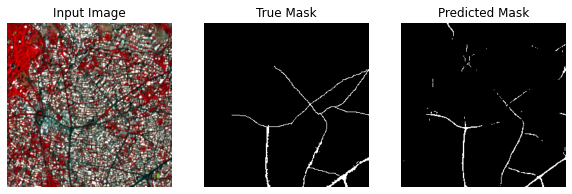

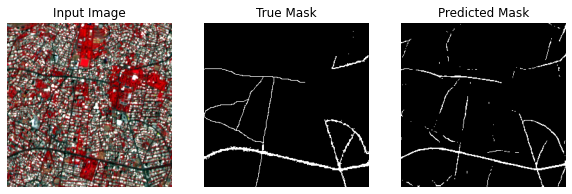

loss=0.0681 ,recall=0.7434 ,precision=0.6651 ,OA=0.9704 ,f1_score=0.7017 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.35s/it]



EPOCH[46] validate:
loss=0.0754 ,recall=0.7162 ,precision=0.7033 ,OA=0.9673 ,f1_score=0.7079 



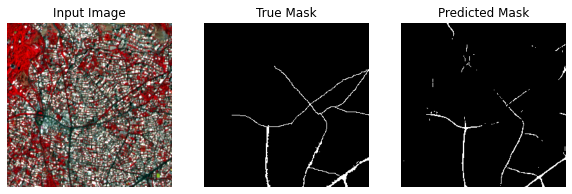

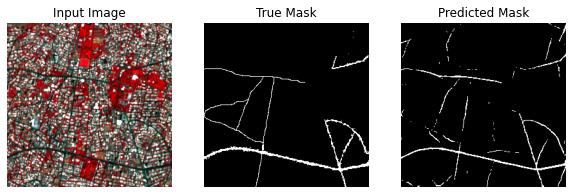

loss=0.0681 ,recall=0.7435 ,precision=0.6652 ,OA=0.9704 ,f1_score=0.7018 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.48s/it]



EPOCH[47] validate:
loss=0.0755 ,recall=0.7065 ,precision=0.7196 ,OA=0.9671 ,f1_score=0.7113 



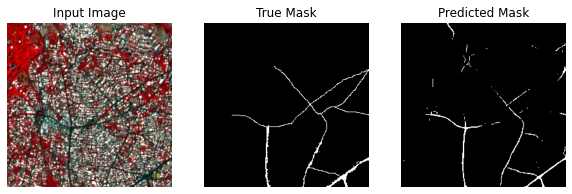

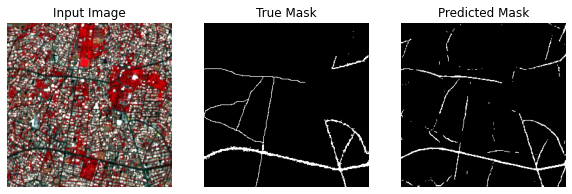

loss=0.0680 ,recall=0.7438 ,precision=0.6655 ,OA=0.9704 ,f1_score=0.7020 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.37s/it]



EPOCH[48] validate:
loss=0.0749 ,recall=0.7202 ,precision=0.7015 ,OA=0.9675 ,f1_score=0.7090 



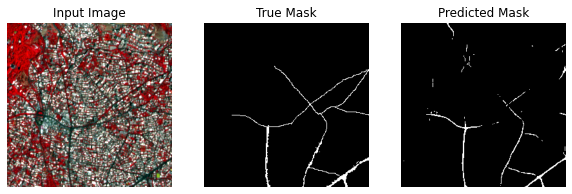

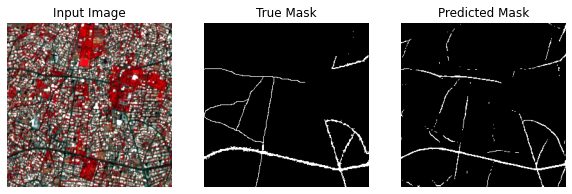

loss=0.0681 ,recall=0.7437 ,precision=0.6651 ,OA=0.9704 ,f1_score=0.7018 : 100%|██████████| 287/287 [06:32<00:00,  1.37s/it]
100%|██████████| 4/4 [00:06<00:00,  1.67s/it]



EPOCH[49] validate:
loss=0.0751 ,recall=0.7196 ,precision=0.6988 ,OA=0.9674 ,f1_score=0.7074 



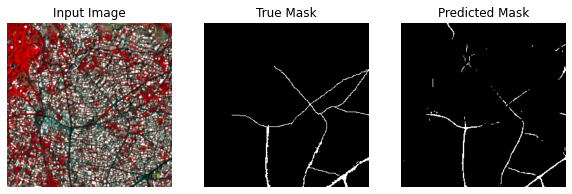

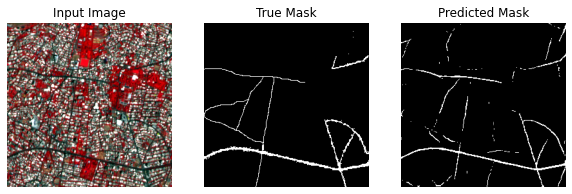

loss=0.0680 ,recall=0.7440 ,precision=0.6657 ,OA=0.9704 ,f1_score=0.7023 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.46s/it]



EPOCH[50] validate:
loss=0.0757 ,recall=0.7067 ,precision=0.7164 ,OA=0.9670 ,f1_score=0.7099 



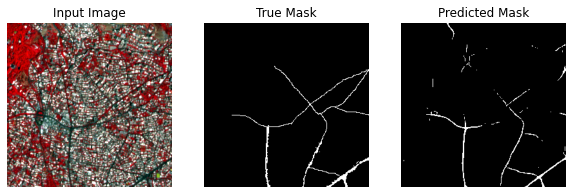

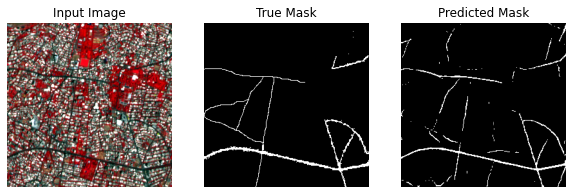

loss=0.0681 ,recall=0.7439 ,precision=0.6650 ,OA=0.9704 ,f1_score=0.7019 : 100%|██████████| 287/287 [06:32<00:00,  1.37s/it]
100%|██████████| 4/4 [00:06<00:00,  1.60s/it]



EPOCH[51] validate:
loss=0.0748 ,recall=0.7127 ,precision=0.7158 ,OA=0.9674 ,f1_score=0.7126 



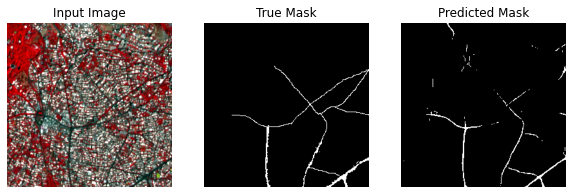

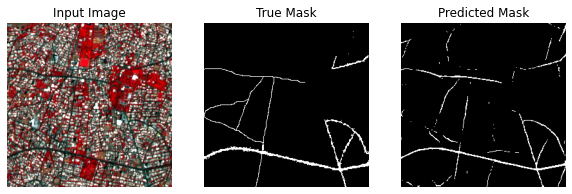

loss=0.0680 ,recall=0.7436 ,precision=0.6662 ,OA=0.9704 ,f1_score=0.7024 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.35s/it]



EPOCH[52] validate:
loss=0.0747 ,recall=0.7210 ,precision=0.7016 ,OA=0.9676 ,f1_score=0.7095 



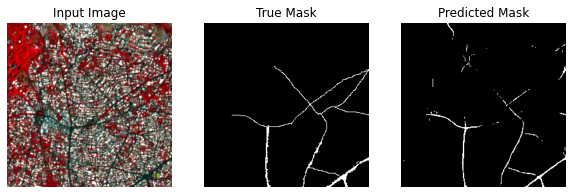

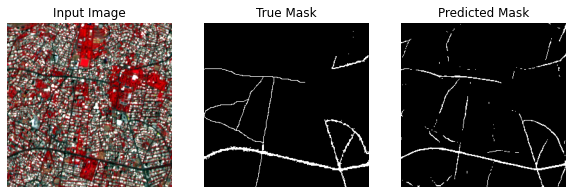

loss=0.0680 ,recall=0.7443 ,precision=0.6655 ,OA=0.9704 ,f1_score=0.7023 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.39s/it]



EPOCH[53] validate:
loss=0.0756 ,recall=0.7027 ,precision=0.7264 ,OA=0.9670 ,f1_score=0.7128 



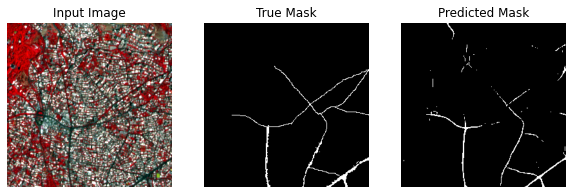

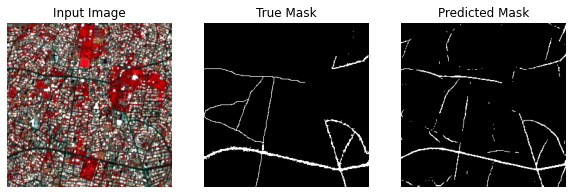

loss=0.0680 ,recall=0.7438 ,precision=0.6654 ,OA=0.9704 ,f1_score=0.7021 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.41s/it]



EPOCH[54] validate:
loss=0.0748 ,recall=0.7128 ,precision=0.7145 ,OA=0.9674 ,f1_score=0.7121 



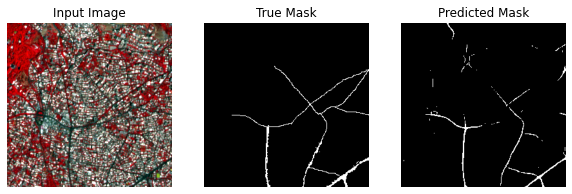

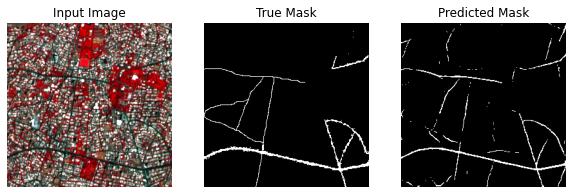

loss=0.0680 ,recall=0.7441 ,precision=0.6656 ,OA=0.9704 ,f1_score=0.7023 : 100%|██████████| 287/287 [06:32<00:00,  1.37s/it]
100%|██████████| 4/4 [00:06<00:00,  1.58s/it]



EPOCH[55] validate:
loss=0.0752 ,recall=0.7064 ,precision=0.7216 ,OA=0.9671 ,f1_score=0.7124 



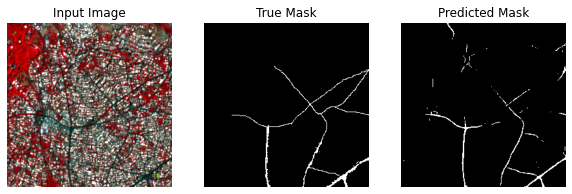

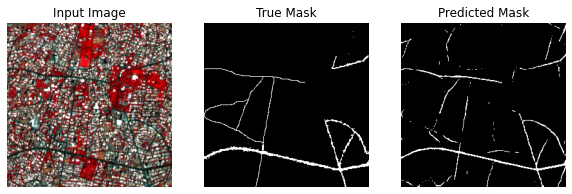

loss=0.0679 ,recall=0.7438 ,precision=0.6669 ,OA=0.9704 ,f1_score=0.7029 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.53s/it]



EPOCH[56] validate:
loss=0.0747 ,recall=0.7213 ,precision=0.7012 ,OA=0.9676 ,f1_score=0.7094 



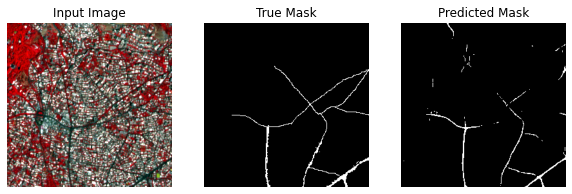

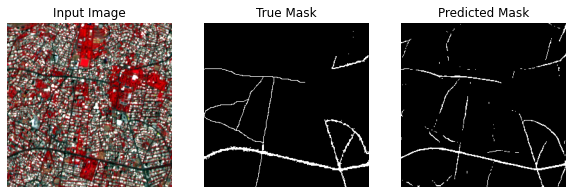

loss=0.0679 ,recall=0.7441 ,precision=0.6664 ,OA=0.9705 ,f1_score=0.7028 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.40s/it]



EPOCH[57] validate:
loss=0.0751 ,recall=0.7153 ,precision=0.7075 ,OA=0.9674 ,f1_score=0.7097 



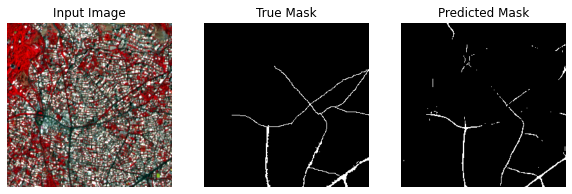

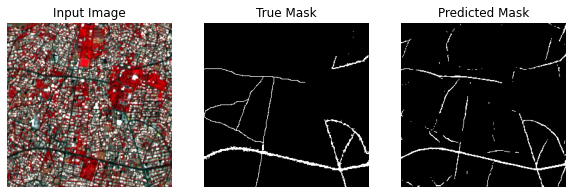

loss=0.0678 ,recall=0.7440 ,precision=0.6667 ,OA=0.9705 ,f1_score=0.7029 : 100%|██████████| 287/287 [06:30<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.37s/it]



EPOCH[58] validate:
loss=0.0748 ,recall=0.7131 ,precision=0.7133 ,OA=0.9674 ,f1_score=0.7116 



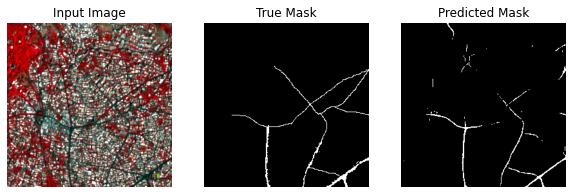

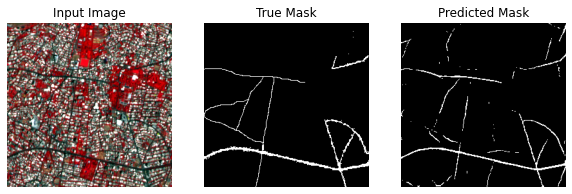

loss=0.0679 ,recall=0.7442 ,precision=0.6661 ,OA=0.9704 ,f1_score=0.7027 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.47s/it]



EPOCH[59] validate:
loss=0.0753 ,recall=0.7090 ,precision=0.7162 ,OA=0.9671 ,f1_score=0.7109 



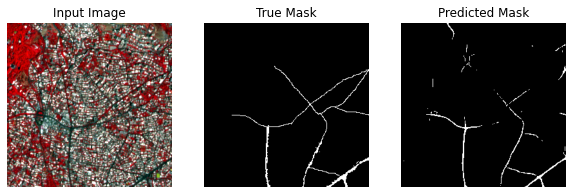

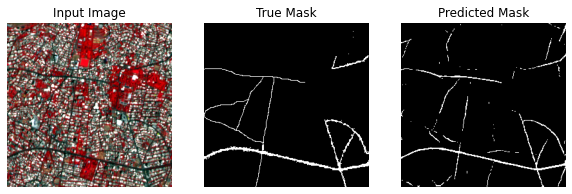

loss=0.0678 ,recall=0.7442 ,precision=0.6664 ,OA=0.9704 ,f1_score=0.7028 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.53s/it]



EPOCH[60] validate:
loss=0.0754 ,recall=0.7046 ,precision=0.7237 ,OA=0.9670 ,f1_score=0.7124 



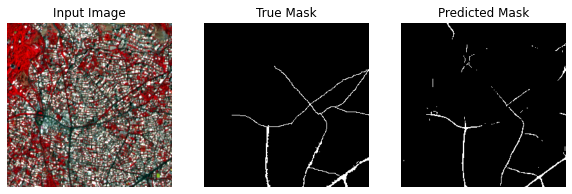

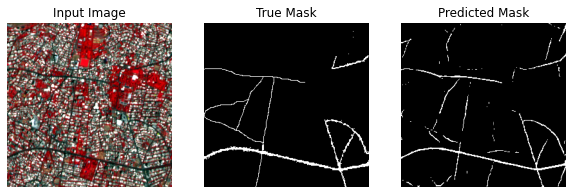

loss=0.0678 ,recall=0.7442 ,precision=0.6673 ,OA=0.9705 ,f1_score=0.7033 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.42s/it]



EPOCH[61] validate:
loss=0.0757 ,recall=0.7040 ,precision=0.7220 ,OA=0.9669 ,f1_score=0.7113 



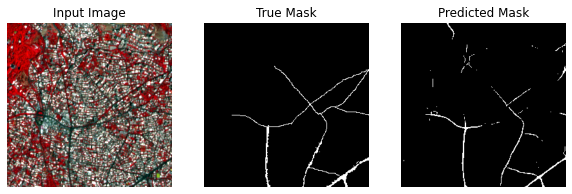

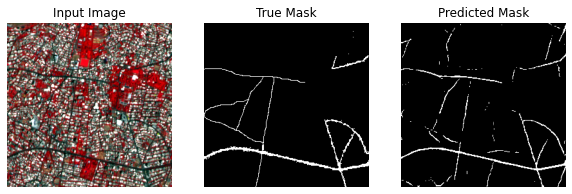

loss=0.0679 ,recall=0.7445 ,precision=0.6666 ,OA=0.9704 ,f1_score=0.7030 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:06<00:00,  1.55s/it]



EPOCH[62] validate:
loss=0.0754 ,recall=0.7098 ,precision=0.7145 ,OA=0.9672 ,f1_score=0.7105 



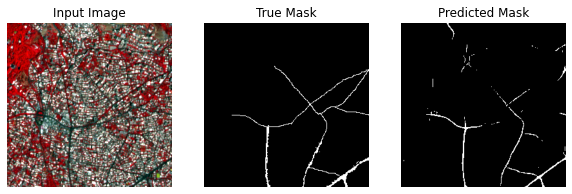

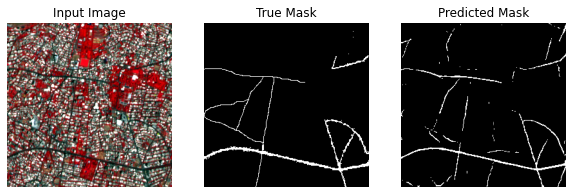

loss=0.0678 ,recall=0.7443 ,precision=0.6664 ,OA=0.9705 ,f1_score=0.7029 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.43s/it]



EPOCH[63] validate:
loss=0.0752 ,recall=0.7127 ,precision=0.7116 ,OA=0.9673 ,f1_score=0.7105 



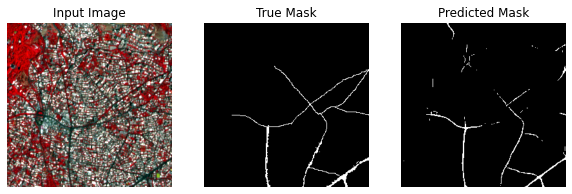

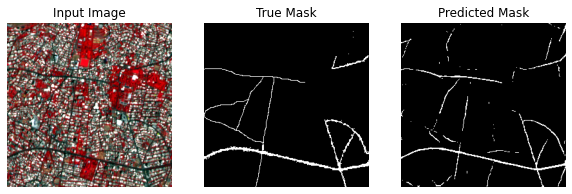

loss=0.0678 ,recall=0.7444 ,precision=0.6668 ,OA=0.9705 ,f1_score=0.7032 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.43s/it]



EPOCH[64] validate:
loss=0.0756 ,recall=0.7032 ,precision=0.7241 ,OA=0.9669 ,f1_score=0.7119 



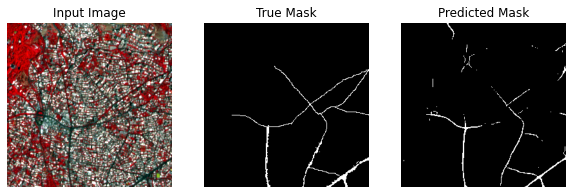

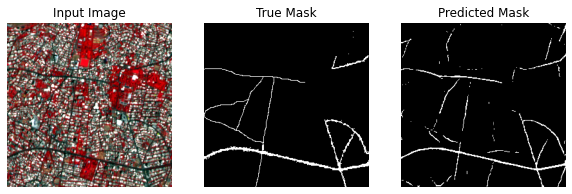

loss=0.0678 ,recall=0.7445 ,precision=0.6667 ,OA=0.9705 ,f1_score=0.7031 : 100%|██████████| 287/287 [06:32<00:00,  1.37s/it]
100%|██████████| 4/4 [00:06<00:00,  1.61s/it]



EPOCH[65] validate:
loss=0.0751 ,recall=0.7109 ,precision=0.7151 ,OA=0.9672 ,f1_score=0.7113 



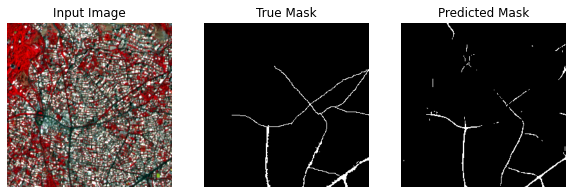

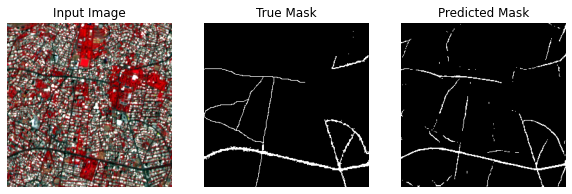

loss=0.0679 ,recall=0.7440 ,precision=0.6669 ,OA=0.9704 ,f1_score=0.7030 : 100%|██████████| 287/287 [06:31<00:00,  1.37s/it]
100%|██████████| 4/4 [00:05<00:00,  1.38s/it]



EPOCH[66] validate:
loss=0.0754 ,recall=0.7112 ,precision=0.7119 ,OA=0.9672 ,f1_score=0.7098 



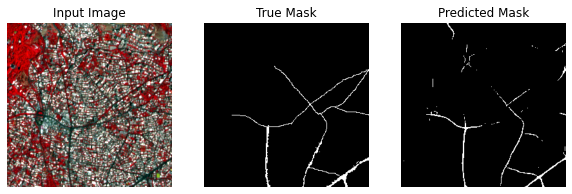

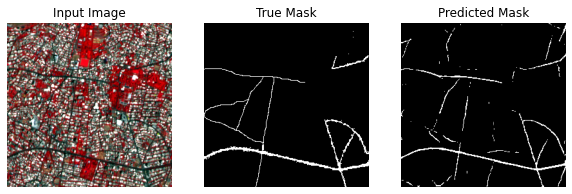

loss=0.0678 ,recall=0.7447 ,precision=0.6663 ,OA=0.9705 ,f1_score=0.7030 : 100%|██████████| 287/287 [06:31<00:00,  1.36s/it]
100%|██████████| 4/4 [00:05<00:00,  1.39s/it]



EPOCH[67] validate:
loss=0.0754 ,recall=0.7065 ,precision=0.7204 ,OA=0.9671 ,f1_score=0.7118 



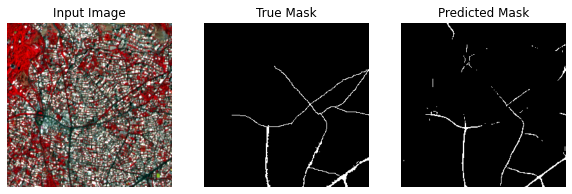

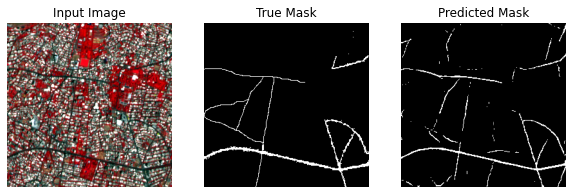

In [ ]:
iterator = iter(ds_train)
max_score = 0
for epoch in range(EPOCHS):
  pbar = tqdm.tqdm(range(train_steps))
  for step in pbar:
    images, labels = next(iterator)
    labels = tf.cast(labels, tf.float32)
    train_fn(images, labels)
    s = "loss=%2.4f ,recall=%2.4f ,precision=%2.4f ,OA=%2.4f ,f1_score=%2.4f "%(metrics['loss'].result(),
                                                                                metrics['recall'].result(),
                                                                                metrics['precision'].result(),
                                                                                metrics['OA'].result(),
                                                                                metrics['f1_score'].result())
    pbar.set_description(s)

  clear_states(metrics)
  test_iterator = iter(ds_val)
  pbar = tqdm.tqdm(range(val_steps))
  for step in pbar:
    images, labels = next(test_iterator)
    labels = tf.cast(labels, tf.float32)
    evaluate(images, labels)
  for d in test_metrics.keys():
    test_history[d].append(test_metrics[d].result().numpy())
  info = "loss=%2.4f ,recall=%2.4f ,precision=%2.4f ,OA=%2.4f ,f1_score=%2.4f "%(test_metrics['loss'].result(),
                                                                                test_metrics['recall'].result(),
                                                                                test_metrics['precision'].result(),
                                                                                test_metrics['OA'].result(),
                                                                                test_metrics['f1_score'].result())


  print("\nEPOCH[%d] validate:"%epoch)
  print(info)
  if max_score<test_metrics['f1_score'].result().numpy():
    max_score = test_metrics['f1_score'].result().numpy()
    ckpt_manager.save(epoch)
  print()
  show_predictions(ds_test, num=2)
  clear_states(test_metrics)
  with open('/content/drive/MyDrive/road/train_hist_f1.txt', 'w') as f:
    for item in train_history['f1_score']:
      f.write("%s\n" % item)
  with open('/content/drive/MyDrive/road/train_hist_precision.txt', 'w') as f:
    for item in train_history['precision']:
      f.write("%s\n" % item)
  with open('/content/drive/MyDrive/road/train_hist_recall.txt', 'w') as f:
    for item in train_history['recall']:
      f.write("%s\n" % item)
  with open('/content/drive/MyDrive/road/train_hist_oa.txt', 'w') as f:
    for item in train_history['OA']:
      f.write("%s\n" % item)


  with open('/content/drive/MyDrive/road/test_hist_f1.txt', 'w') as f:
    for item in test_history['f1_score']:
      f.write("%s\n" % item)
  with open('/content/drive/MyDrive/road/test_hist_precision.txt', 'w') as f:
    for item in test_history['precision']:
      f.write("%s\n" % item)
  with open('/content/drive/MyDrive/road/test_hist_recall.txt', 'w') as f:
    for item in test_history['recall']:
      f.write("%s\n" % item)

  with open('/content/drive/MyDrive/road/test_hist_oa.txt', 'w') as f:
    for item in test_history['OA']:
      f.write("%s\n" % item)



In [ ]:
print(max_score)

0.7143143


In [ ]:
test_hist_f1 = []
f = open("/content/drive/MyDrive/road/files/test_hist_f1.txt", "r")
for x in f:
  l = x.replace('\n', '')
  test_hist_f1.append(np.float32(x))

In [ ]:
test_hist_oa = []
f = open("/content/drive/MyDrive/road/files/test_hist_oa.txt", "r")
for x in f:
  l = x.replace('\n', '')
  test_hist_oa.append(np.float32(x))

In [ ]:
test_hist_precision = []
f = open("/content/drive/MyDrive/road/files/test_hist_precision.txt", "r")
for x in f:
  l = x.replace('\n', '')
  test_hist_precision.append(np.float32(x))

In [ ]:
test_hist_recall = []
f = open("/content/drive/MyDrive/road/files/test_hist_recall.txt", "r")
for x in f:
  l = x.replace('\n', '')
  test_hist_recall.append(np.float32(x))

In [ ]:
history = test_history.copy()
len(history['f1_score'])

68

In [ ]:
test_history = history.copy()

In [ ]:
test_history['f1_score'] = test_hist_f1[0:32] + test_history['f1_score']
len(test_history['f1_score'])

100

In [ ]:
test_history['OA'] = test_hist_oa[0:32] + test_history['OA']
len(test_history['OA'])

100

In [ ]:
test_history['precision'] = test_hist_precision[0:32] + test_history['precision']
len(test_history['precision'])

100

In [ ]:
test_history['recall'] = test_hist_recall[0:32] + test_history['recall']
len(test_history['recall'])

100

In [ ]:
test_hist_f1 = []
f = open("/content/drive/MyDrive/road/files/train_hist_f1.txt", "r")
for x in f:
  l = x.replace('\n', '')
  test_hist_f1.append(np.float32(x))
test_hist_oa = []
f = open("/content/drive/MyDrive/road/files/train_hist_oa.txt", "r")
for x in f:
  l = x.replace('\n', '')
  test_hist_oa.append(np.float32(x))
test_hist_precision = []
f = open("/content/drive/MyDrive/road/files/train_hist_precision.txt", "r")
for x in f:
  l = x.replace('\n', '')
  test_hist_precision.append(np.float32(x))
test_hist_recall = []
f = open("/content/drive/MyDrive/road/files/train_hist_recall.txt", "r")
for x in f:
  l = x.replace('\n', '')
  test_hist_recall.append(np.float32(x))

In [ ]:
train_history['f1_score'] = test_hist_f1[0:32] + train_history['f1_score']
train_history['OA'] = test_hist_oa[0:32] + train_history['OA']
train_history['precision'] = test_hist_precision[0:32] + train_history['precision']
train_history['recall'] = test_hist_recall[0:32] + train_history['recall']
len(train_history['recall'])

19548

# Plots:

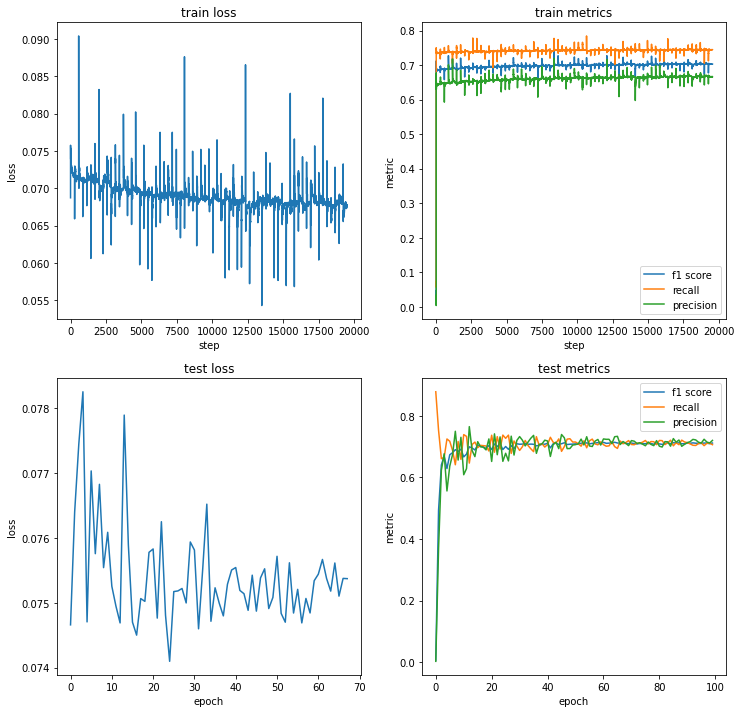

In [ ]:
plt.figure(figsize=(12,12))
plt.subplot(2,2,1)
plt.plot(train_history['loss'])
plt.title("train loss")
plt.xlabel("step")
plt.ylabel("loss")
plt.subplot(2,2,2)
plt.plot(train_history['f1_score'],'-',train_history['recall'],'-',train_history['precision'],'-')
plt.title("train metrics")
plt.legend(["f1 score","recall", "precision"])
plt.xlabel("step")
plt.ylabel("metric")
plt.subplot(2,2,3)
plt.plot(test_history['loss'])
plt.title("test loss")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.subplot(2,2,4)
plt.plot(test_history['f1_score'],'-',test_history['recall'],'-',test_history['precision'],'-')
plt.title("test metrics")
plt.legend(["f1 score","recall", "precision"])
plt.xlabel("epoch")
plt.ylabel("metric")
plt.savefig('result metrics.png')

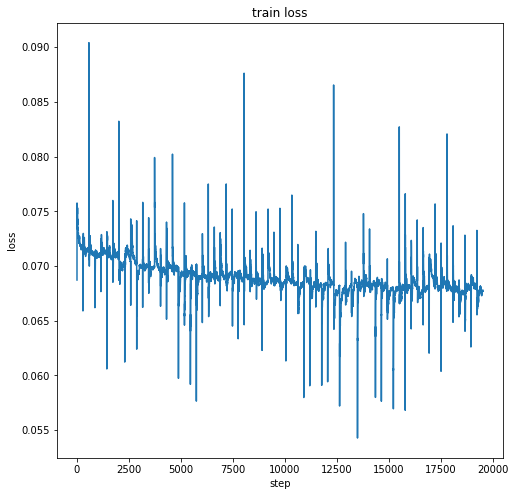

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_history['loss'])
plt.title("train loss")
plt.xlabel("step")
plt.ylabel("loss")
plt.savefig('train loss.png')

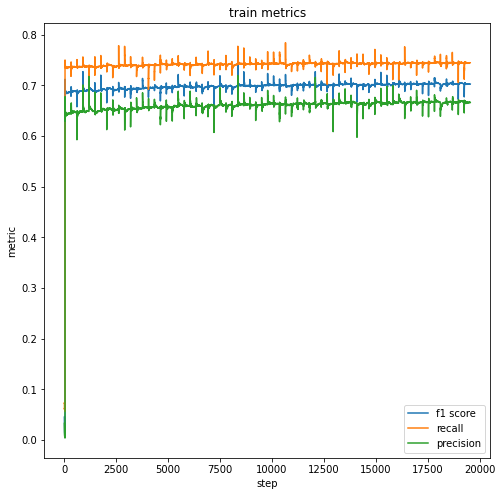

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(train_history['f1_score'],'-',train_history['recall'],'-',train_history['precision'],'-')
plt.title("train metrics")
plt.legend(["f1 score","recall", "precision"])
plt.xlabel("step")
plt.ylabel("metric")
plt.savefig('train metrics.png')

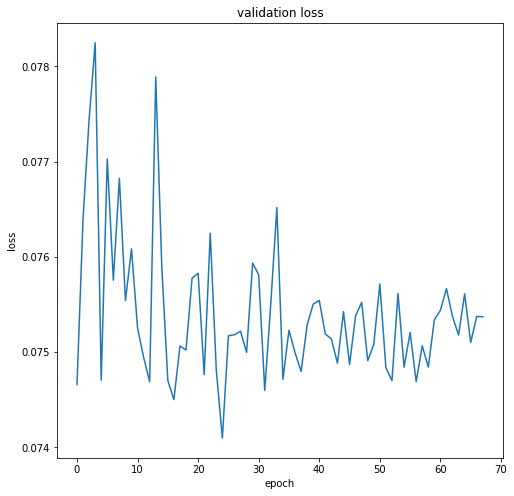

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(test_history['loss'])
plt.title("validation loss")
plt.xlabel("epoch")
plt.ylabel("loss")
plt.savefig('validation loss.png')

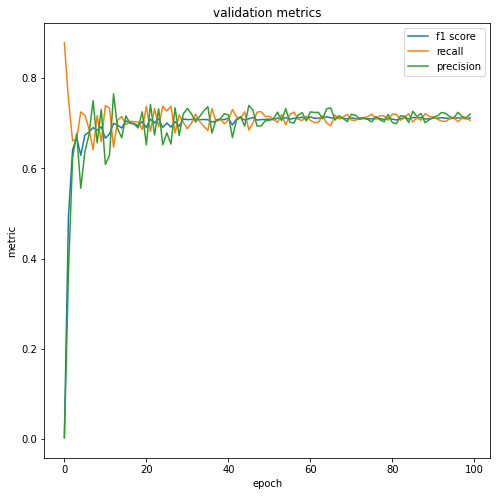

In [ ]:
plt.figure(figsize=(8,8))
plt.plot(test_history['f1_score'],'-',test_history['recall'],'-',test_history['precision'],'-')
plt.title("validation metrics")
plt.legend(["f1 score","recall", "precision"])
plt.xlabel("epoch")
plt.ylabel("metric")
plt.savefig('validation metrics.png')

## Evaluate model:

**Load best model**

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/road/rdrcnn'
ckpt = tf.train.Checkpoint(optimizer=optimizer, segment_model=model)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_dir,max_to_keep=2)

status = ckpt.restore('/content/drive/MyDrive/road/rdrcnn/ckpt-32')

## Validation

100%|██████████| 105/105 [01:02<00:00,  1.68it/s]


loss=0.0755 ,recall=0.5470 ,precision=0.8942 ,OA=0.9517 ,f1_score=0.6775 



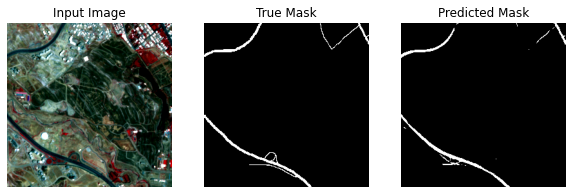

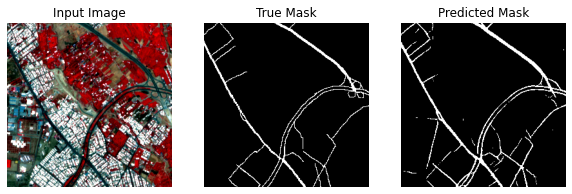

In [ ]:
test_iterator = iter(ds_val)
pbar = tqdm.tqdm(range(num_test_samples))
clear_states(test_metrics)
for step in pbar:
  images, labels = next(test_iterator)
  labels = tf.cast(labels, tf.float32)
  evaluate(images, labels, score_threshold=.2)
for d in test_metrics.keys():
  test_history[d].append(test_metrics[d].result().numpy())
info = "loss=%2.4f ,recall=%2.4f ,precision=%2.4f ,OA=%2.4f ,f1_score=%2.4f "%(test_metrics['loss'].result(),
                                                                              test_metrics['recall'].result(),
                                                                              test_metrics['precision'].result(),
                                                                              test_metrics['OA'].result(),
                                                                              test_metrics['f1_score'].result())


print(info)
print()
show_predictions(ds_val, num=2)


## test

100%|██████████| 105/105 [02:00<00:00,  1.15s/it]


loss=0.1234 ,recall=0.7608 ,precision=0.7437 ,OA=0.9571 ,f1_score=0.7514 



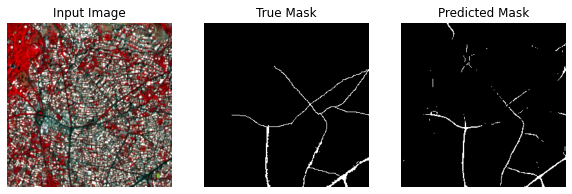

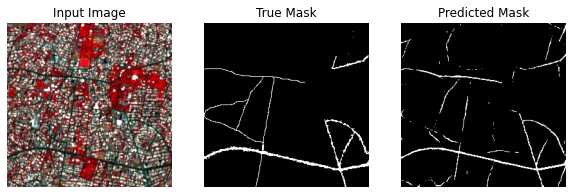

In [ ]:
test_iterator = iter(ds_test)
pbar = tqdm.tqdm(range(num_test_samples))
clear_states(test_metrics)
for step in pbar:
  images, labels = next(test_iterator)
  labels = tf.cast(labels, tf.float32)
  evaluate(images, labels, score_threshold=.2)
for d in test_metrics.keys():
  test_history[d].append(test_metrics[d].result().numpy())
info = "loss=%2.4f ,recall=%2.4f ,precision=%2.4f ,OA=%2.4f ,f1_score=%2.4f "%(test_metrics['loss'].result(),
                                                                              test_metrics['recall'].result(),
                                                                              test_metrics['precision'].result(),
                                                                              test_metrics['OA'].result(),
                                                                              test_metrics['f1_score'].result())


print(info)
print()
show_predictions(ds_test, num=2)


# Test:



In [ ]:
def make_prediction(imgs_list,save_path=None,save=False, score_threshold=0.2):
  if save_path is not None:
    if not os.path.exists(save_path):
      os.makedirs(save_path)
  for img_path in imgs_list:

    ##############
    raw_img = tf.io.read_file(img_path)
    img = tfio.experimental.image.decode_tiff(raw_img)
    mask_path = img_path.replace('tif',"png")
    is_mask = False
    try:
      raw_mask = tf.io.read_file(mask_path)
      mask = tf.image.decode_png(raw_mask)*255
      is_mask = True
    except Exception as e:
      print(e)
      pass




    #############
    h, w, _ = img.shape
    prediction = np.zeros((h,w,1),np.uint8)
    ns = 0
    for i in range(0,h-1,IMG_SIZE):
      for j in range(0,w-1,IMG_SIZE):
        x0 = j
        x1 = j + IMG_SIZE
        if x1>=w:
          x1 = w - 1
        y0 = i
        y1 = i + IMG_SIZE
        if y1>=h:
          y1 = h - 1
        sub_img = tf.image.crop_to_bounding_box(img,y0,x0,y1-y0,x1-x0)
        sub_image = sub_img.numpy()
        if is_mask:
          sub_mask = tf.image.crop_to_bounding_box(mask,y0,x0,y1-y0,x1-x0)
        pady = IMG_SIZE - (y1-y0)
        padx = IMG_SIZE - (x1-x0)
        sub_img = tf.image.resize_with_crop_or_pad(sub_img,IMG_SIZE,IMG_SIZE)
        sub_img.set_shape([IMG_SIZE,IMG_SIZE,4])
        sub_img = tfio.experimental.color.rgba_to_rgb(sub_img)
        sub_img = (tf.cast(sub_img,tf.float32) - 128.)/128.
        sub_img = sub_img[tf.newaxis,...]
        pred = model.predict(sub_img) [0]
        #pred_mask = tf.nn.sigmoid(pred).numpy()[0]
        pred_mask = tf.where(pred>=score_threshold,tf.ones_like(pred),tf.zeros_like(pred))
        prediction[y0:y1,x0:x1] += pred_mask[pady//2:pady//2+y1-y0,padx//2:padx//2+x1-x0]
        if save:
          sub_pred = prediction[y0:y1,x0:x1]
          sub_pred = np.clip(sub_pred,0,1)
          sub_pred = np.uint8(sub_pred*255)
          name1 = save_path + '/%d_pred-'%ns + img_path.split('/')[-1]
          name2 = save_path + '/%d_gt-'%ns + mask_path.split('/')[-1]
          name3 = save_path + '/%d_img-'%ns + mask_path.split('/')[-1]
          ns += 1
          cv2.imwrite(name1, sub_pred)
          cv2.imwrite(name3, sub_image)
          if is_mask:
            cv2.imwrite(name2, sub_mask.numpy())

    if save:
      prediction = np.clip(prediction,0,1)
      prediction = np.uint8(prediction*255)
      name1 = save_path + '/pred_' + img_path.split('/')[-1]
      name2 = save_path + '/gt_' + mask_path.split('/')[-1]
      cv2.imwrite(name1, prediction)
      if is_mask:
        cv2.imwrite(name2, mask.numpy())



In [ ]:
test_images = ['/content/drive/MyDrive/road/all/TEHRAN_OPTIC.tif']
make_prediction(test_images,'predictions',True, score_threshold=.2)

In [ ]:
!zip -r predictions.zip predictions

  adding: predictions/ (stored 0%)
  adding: predictions/0_img-TEHRAN_OPTIC.png (deflated 0%)
  adding: predictions/149_gt-TEHRAN_OPTIC.png (deflated 9%)
  adding: predictions/118_img-TEHRAN_OPTIC.png (deflated 0%)
  adding: predictions/70_pred-TEHRAN_OPTIC.tif (deflated 9%)
  adding: predictions/33_gt-TEHRAN_OPTIC.png (deflated 12%)
  adding: predictions/68_pred-TEHRAN_OPTIC.tif (deflated 51%)
  adding: predictions/142_img-TEHRAN_OPTIC.png (deflated 0%)
  adding: predictions/48_pred-TEHRAN_OPTIC.tif (deflated 2%)
  adding: predictions/42_pred-TEHRAN_OPTIC.tif (deflated 34%)
  adding: predictions/131_gt-TEHRAN_OPTIC.png (deflated 15%)
  adding: predictions/3_pred-TEHRAN_OPTIC.tif (deflated 81%)
  adding: predictions/17_pred-TEHRAN_OPTIC.tif (deflated 49%)
  adding: predictions/47_pred-TEHRAN_OPTIC.tif (deflated 4%)
  adding: predictions/87_pred-TEHRAN_OPTIC.tif (deflated 5%)
  adding: predictions/103_img-TEHRAN_OPTIC.png (deflated 0%)
  adding: predictions/1_pred-TEHRAN_OPTIC.tif (defl